OBLIGATORIO MACHINE LEARNING

Agustina Disiot 221025

Iván Monjardin 239850

Primero vamos a importar todo lo que vamos a usar

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


In [2]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Activation,LeakyReLU, Dropout
from tensorflow.keras import activations
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import metrics
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard

In [3]:
from sklearn.metrics import balanced_accuracy_score
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

Cargamos el data set

In [42]:
df=pd.read_csv("new_classification_train.csv", sep = ",")

In [43]:
df.head()

,id,headline,authors,short_description,date,category
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT


El head lo hicimos para ver que headlines habia y ver la estructura de cada una de las variables.

Hacemos el pandas profiling para obtener una analisis mas detallado de los datos.

In [44]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df)

profile

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134571 entries, 0 to 134570
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   id                 134571 non-null  int64 
 1   headline           134568 non-null  object
 2   authors            110094 non-null  object
 3   short_description  121308 non-null  object
 4   date               134571 non-null  object
 5   category           134571 non-null  object
dtypes: int64(1), object(5)
memory usage: 6.2+ MB


Hicimos el pandas profiling. Vimos que faltaban columnas. Analizamos el tipo de los datos y vemos que son de tipo object. Ahora vamos a cambiar ese tipo para que aparezcan en el pandas profiling.

In [46]:
df['headline'] = (df['headline']).astype(str)

Probamos cambiar un tipo y luego cambiamos todos.

In [47]:
df = df.astype({
    "headline" : "str",
    "authors" : "str",
    "short_description" : "str",
    "date" : "str",
    "category" : "str",
})

Hicimos de nuevo el pandas profiling para los nuevos tipos de datos.

In [48]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df)

profile

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]


Pero vimos que no era conveniente porque los que antes eran missing values ahora cuentan como valores "nan" que no nos sirven y preferimos dejarlos como que no estan. 

In [49]:
df=pd.read_csv("new_classification_train.csv", sep = ",")

Vamos a hacer un histograma de la fecha para ver si los articulos esan uniformamente distribuidos o si hay alguna fecha donde hay mas o menos articulos.

<AxesSubplot:>

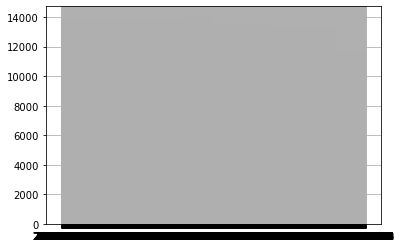

In [50]:
df['date'].hist()

Con la fecha de tipo 'object' no salio bien y vamos a convertirlo a otro tipo.

Primero convertimos la fecha a formato string y luego a numerico, quitandole los guiones, para poder hacer un histograma

In [51]:
df['date'] = (df['date']).astype(str)

In [52]:
df['date'] = pd.to_numeric(df['date'].str.replace('-',''))

In [53]:
df.head()

,id,headline,authors,short_description,date,category
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,20170812,RELIGION
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,20140409,WEDDINGS
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,20141023,COMEDY
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,20170710,BUSINESS
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,20161123,ENTERTAINMENT


<AxesSubplot:>

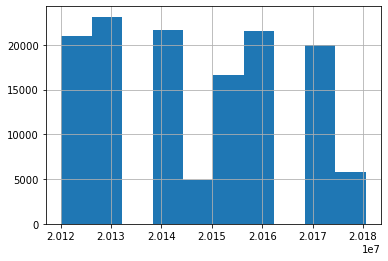

In [54]:
df['date'].hist()

Nos dimos cuenta que para el tipo numerico van a quedar algunos espacios porque no hay fechas entre los meses 13-99.

Intentamos hacerlo por año, para el año 2016 y ocurre lo mismo, no hay fechas para los dias 32-99. Sin embargo si ponemos bins=12, queda mejor agrupado, ya que los dias que no existen no afectan tanto. Probablemente quede mejor graficado en una grafica de barras, pero ahi es mas complicado definir los meses.

<AxesSubplot:>

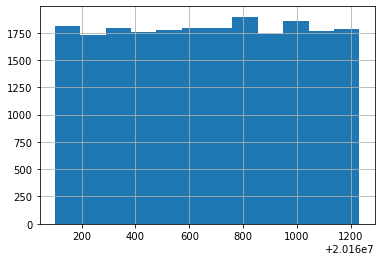

In [55]:
(df['date'][df['date'].apply(lambda x: str(x).startswith("2016"))]).hist(bins= 12)

Queremos utilizar la fecha para otros analisis, por ejemplo la cantidad de articulos por categoria a lo largo del tiempo. 
Obtenemos todas las categorias que hay, pero decidimos utitlizar el top 5 y luego agrupar todas las demas en 'other'

In [56]:
categories = pd.unique(df['category'])
categories

array(['RELIGION', 'WEDDINGS', 'COMEDY', 'BUSINESS', 'ENTERTAINMENT',
       'DIVORCE', 'QUEER VOICES', 'TRAVEL', 'CULTURE & ARTS', 'WORLDPOST',
       'IMPACT', 'BLACK VOICES', 'WELLNESS', 'HEALTHY LIVING',
       'WORLD NEWS', 'WOMEN', 'PARENTING', 'PARENTS', 'SCIENCE',
       'ENVIRONMENT', 'POLITICS', 'FOOD & DRINK', 'COLLEGE', 'CRIME',
       'TASTE', 'ARTS & CULTURE', 'GOOD NEWS', 'STYLE', 'WEIRD NEWS',
       'STYLE & BEAUTY', 'GREEN', 'HOME & LIVING', 'TECH', 'MEDIA',
       'THE WORLDPOST', 'SPORTS', 'ARTS', 'MONEY', 'LATINO VOICES',
       'FIFTY', 'EDUCATION'], dtype=object)

In [57]:
categories = ["POLITICS", "WELLNESS", "ENTERTAINMENT", "TRAVEL", "STYLE AND BEAUTY"]

Graficamos la cantidad de articulos en funcion del año por categoria.

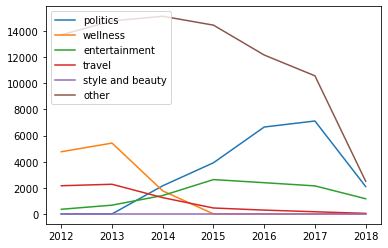

In [58]:
fig,ax=plt.subplots()
dates = ["2012", "2013", "2014", "2015", "2016", "2017", "2018"]
for category in categories:

    dateCat = df[['date','category']].sort_values('date')
    dateCat['date'] = dateCat['date'].apply(lambda x: str(x)[:4])
    dateCat['category'] = df['category'].apply(lambda x: 1 if (x==category) else 0 ) 
 
    cat = dateCat.groupby('date').sum()
    ax.plot(dates, cat, label = category.lower())

dateCat = df[['date','category']].sort_values('date')
dateCat['date'] = dateCat['date'].apply(lambda x: str(x)[:4])
dateCat['category'] = df['category'].apply(lambda x: 1 if (x not in categories) else 0 ) 
cat = dateCat.groupby('date').sum()

ax.plot(dates, cat, label = "other")


plt.legend(loc="upper left")
plt.show()

Ademas de graficar los valores abolutos, queriamos ver los relativos (porcentaje de esa categoria en el año). Para eso dividimos entre la cantidad anual.

In [59]:
dateCat2 = df[['date','category']].sort_values('date')
dateCat2['date'] = dateCat2['date'].apply(lambda x: str(x)[:4])
quantity = dateCat2.groupby('date').count()['category']
quantity

date
2012    20979
2013    23139
2014    21704
2015    21449
2016    21497
2017    19998
2018     5805
Name: category, dtype: int64

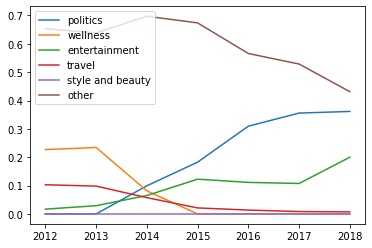

In [60]:
fig,ax=plt.subplots()
dates = ["2012", "2013", "2014", "2015", "2016", "2017", "2018"]
for category in categories:

    dateCat = df[['date','category']].sort_values('date')
    dateCat['date'] = dateCat['date'].apply(lambda x: str(x)[:4])
    dateCat['category'] = df['category'].apply(lambda x: 1 if (x==category) else 0 ) 
 
    cat = dateCat.groupby('date').sum()
    cat['category'] = cat['category'].div(quantity)
    ax.plot(dates, cat, label = category.lower())

dateCat = df[['date','category']].sort_values('date')
dateCat['date'] = dateCat['date'].apply(lambda x: str(x)[:4])
dateCat['category'] = df['category'].apply(lambda x: 1 if (x not in categories) else 0 ) 
cat = dateCat.groupby('date').sum()
cat['category'] = cat['category'].div(quantity)

ax.plot(dates, cat, label = "other")


plt.legend(loc="upper left")
plt.show()


Con el tipo datetime nos soluciona el problema de las fechas faltantes.

In [61]:
df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')

Ahora podemos hacer un histograma mejor y ver que en el ultimo año se seleccionaron menos articulos. 

<AxesSubplot:xlabel='date'>

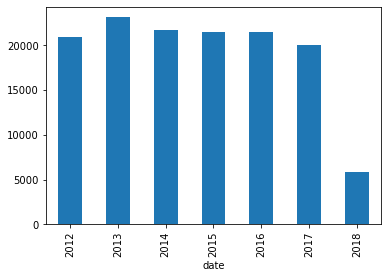

In [62]:
df['date'].groupby(df["date"].dt.year).count().plot(kind="bar")

<AxesSubplot:xlabel='date'>

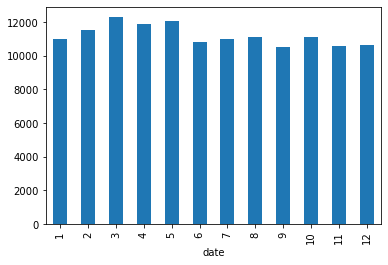

In [63]:
df['date'].groupby(df["date"].dt.month).count().plot(kind="bar")

<AxesSubplot:>

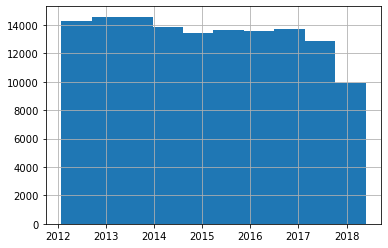

In [64]:
df['date'].hist()

In [65]:
df['date'].sort_values()

67882    2012-01-28
128367   2012-01-28
88093    2012-01-28
125747   2012-01-28
72390    2012-01-28
            ...    
44133    2018-05-26
112967   2018-05-26
114748   2018-05-26
24013    2018-05-26
68555    2018-05-26
Name: date, Length: 134571, dtype: datetime64[ns]

Otro analisis que queremos hacer es ver la relacion entre autores y categorias, si un autor tiende a escribir mas sobre una categoria o si esta distribuido.
Nuestra hipotesis es que sabiendo el autor es probable que puedas predecir la categoria de sus articulos.

El primer paso es pasar las variables de autores y categoria a variables categoricas

In [66]:
df['category'] = (df['category']).astype('category')

In [67]:
(df['authors']).astype('category')


0         David J. Dunn, PhD, ContributorTheological tro...
1                                                       NaN
2                                             Katla McGlynn
3         PureWow, ContributorWhat your girl crush reads...
4                                           Carly Ledbetter
                                ...                        
134566                                                  NaN
134567                W Magazine, Contributor\r\nW Magazine
134568    John Willey, Contributor\r\nBlogger, DaddysInC...
134569                                                  NaN
134570                           Damon Dahlen and Lee Moran
Name: authors, Length: 134571, dtype: category
Categories (22005, object): [' Basil Kreimendahl, Contributor\r\nPlaywright', ' Bill Bigelow, ContributorRethinking Schools ..., ' Bustle, Contributor\r\nNews, entertainment, ..., ' Bustle, ContributorNews, entertainment, life..., ..., 'yd Zeigler, Outsports', 'Élisabeth Badinter, Contributor

Nos dimos cuenta que la columna de los autores no es simplemente un nombre si no que tiene cierta descripcion, y en lugar de editar la columna en nuestro df agregamos la columna aparte. Agregamos una columna numerica para los autores para poder visualizar la relacion en el pandas profiling. 

In [68]:
df['category_nums'] = (df['category']).astype('category').cat.codes

In [69]:
df['authors_cat'] = (df['authors']).astype('category').cat.codes

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134571 entries, 0 to 134570
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   id                 134571 non-null  int64         
 1   headline           134568 non-null  object        
 2   authors            110094 non-null  object        
 3   short_description  121308 non-null  object        
 4   date               134571 non-null  datetime64[ns]
 5   category           134571 non-null  category      
 6   category_nums      134571 non-null  int8          
 7   authors_cat        134571 non-null  int16         
dtypes: category(1), datetime64[ns](1), int16(1), int64(1), int8(1), object(3)
memory usage: 5.6+ MB


In [71]:
profile = ProfileReport(df)

profile

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


En el profiling nos dimos cuenta que tampoco nos ayudaba mucho y no se mostraban las correlaciones numericas.
Decidimos usar el seaborn para que nos muestre los numeros del indice de correlacion.

Text(0.5, 1.0, 'Correlation Heatmap')

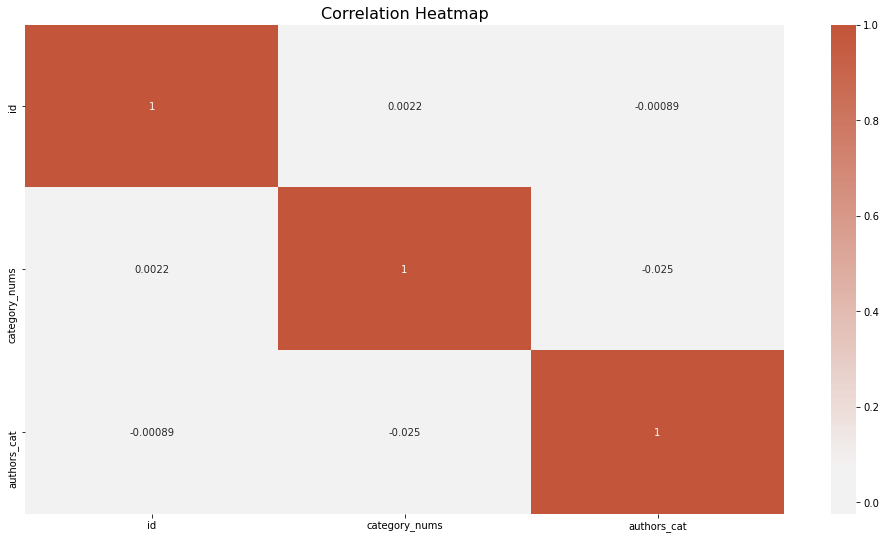

In [72]:
# Mapa de correlación (con detalle)
import seaborn as sns
cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)
plt.figure(figsize=(17,9))
sns.heatmap(df.corr(), annot=True,cmap=cmap, center=0).set_title("Correlation Heatmap", fontsize=16)

Tampoco nos servia mucho ver estos indices asi que hicimos el siguiente codigo para ver el numero de cuantas categorias diferentes que escribe cada autor.

In [73]:
difauthors = df['authors'].unique()
authorscat = []

In [ ]:
for author in difauthors:
    print(len(df['category'][df['authors'] == author].unique()) , author)
    authorscat.append(len(df['category'][df['authors'] == author].unique()))

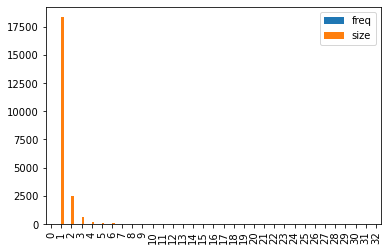

In [ ]:
dfauth = pd.DataFrame({'freq': authorscat})
dfauth.groupby('freq', as_index=False).size().plot(kind='bar')
plt.show()

Para los articulos que tienen autor, la mayoria de los autores escriben en 1 categoria o maximo en 2 o 3. Claramente hay excepciones, como Reuters, que aparece en 20 categorias diferentes. Ademas creemos que esto puede estar sesgado por los autores que solo aparecen una vez, por o tanto queremos ahora analisar para los autores que aparecen mas veces. 

In [ ]:
topauthors = df.groupby('authors').filter(lambda x: len(x) > 7)['authors'].unique()
print(topauthors)
print(len(topauthors))

['Katla McGlynn' 'PureWow, ContributorWhat your girl crush reads online'
 'Carly Ledbetter' ...
 'David Seaman, ContributorYouTuber, researcher, and cryptocurrency enthusiast'
 'Jacada Travel, Contributor\r\nInspired, Tailor-Made Travel to Latin America, Africa, Asia, A...'
 'Robin Korth, ContributorInternational author and speaker']
1603


In [ ]:
topauthorscatc = []
for author in topauthors:
    print(len(df['category'][df['authors'] == author].unique()) , author)
    topauthorscatc.append(len(df['category'][df['authors'] == author].unique()))

2 Katla McGlynn
5 PureWow, ContributorWhat your girl crush reads online
14 Carly Ledbetter
3 E. Oliver Whitney
1 Debbi Dickinson, Contributor
Entrepreneur
1 MiniTime, Contributor
MiniTime is the first family travel site with personalized rec...
4 Priscilla Frank
1 Raghida Dergham, ContributorColumnist and Senior Diplomatic Correspondent, Al Hayat
20 Reuters, Reuters
5 Cole Delbyck
3 Oyster.com, Contributor
The Hotel Tell-All
1 James Michael Nichols
7 Caroline Bologna
9 Catherine Pearson
2 Jacqueline Howard
1 Kim Simon, Contributor
Writer. Mother. Wife. Truth-teller. Victim Advocate.
1 JJ Virgin, Contributor
Celebrity nutrition, fitness, and mindset expert
1 Food52, Contributor
food52.com
1 Karen Schaler, Contributor
Emmy award-winning screenwriter, producer, author and creator ...
12 Paige Lavender
2 Chris Weigant, ContributorPolitical writer and blogger at ChrisWeigant.com
2 Lawrence Hurley, Reuters
6 Stateline, ContributorStateline provides daily reporting and analysis on trends in s

(array([692., 357., 177., 118.,  60.,  47.,   0.,  24.,  21.,  15.,  13.,
         11.,   9.,   0.,   6.,   5.,   3.,   1.,   4.,   2.,   0.,   6.,
          4.,   9.,   3.,   3.,   2.,   0.,   1.,   3.,   2.,   0.,   0.,
          0.,   0.,   1.,   1.,   0.,   1.,   1.,   1.]),
 array([ 1.        ,  1.85365854,  2.70731707,  3.56097561,  4.41463415,
         5.26829268,  6.12195122,  6.97560976,  7.82926829,  8.68292683,
         9.53658537, 10.3902439 , 11.24390244, 12.09756098, 12.95121951,
        13.80487805, 14.65853659, 15.51219512, 16.36585366, 17.2195122 ,
        18.07317073, 18.92682927, 19.7804878 , 20.63414634, 21.48780488,
        22.34146341, 23.19512195, 24.04878049, 24.90243902, 25.75609756,
        26.6097561 , 27.46341463, 28.31707317, 29.17073171, 30.02439024,
        30.87804878, 31.73170732, 32.58536585, 33.43902439, 34.29268293,
        35.14634146, 36.        ]),
 <BarContainer object of 41 artists>)

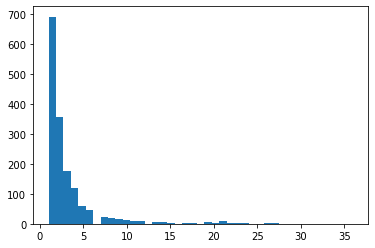

In [ ]:
plt.hist(topauthorscatc, bins=41)

Si bien los autores que aparecen mas veces escriben sobre temas diferentes, en general la mayoria escriben siempre en una o dos categorias.

Analizamos los distintos atributos y sus NaN para ver si podimos reemplazarlos por algun otro valor (por ejemplo por la media o la moda). En principio no le vimos tanta utilidad y decidimos no hacerlo, si mas adelante vemos que podria sernos util para los distintos modelos, veremos.

Conclusiones del analisis: 
- Hay una cantidad (18%) de articulos sin autores especificados.
- Los articulos son desde el 2012 al 2018, aunque en el año 2018 solo llega hasta mayo (mes 5).
- La cantidad de articulos por año es similar, sin contar 2018.
- La distribucion de las categorias no es constante a lo largo del tiempo, por lo tanto la fecha va a ser una buena feature para estimar.
- Hay categorias que tienen poca cantidad de articulos, por lo tanto vamos a tener qe tenerlo en cuenta a la hora de elegir las metricas que utilicemos.
- El autor puede servir mucho para deducir la categoria.

Vamos a dejar en el dataframe solo las columnas que queremos, eliminando las que agregamos, que solo nos otorgan informacion repetida.


In [ ]:
df.head()

,id,headline,authors,short_description,date,category,category_nums,authors_cat
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION,26,5005
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS,35,-1
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY,5,11506
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS,3,16913
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT,10,3197


In [ ]:
df = df.drop(columns=['authors_cat', 'category_nums', 'id'])

In [ ]:
df

,headline,authors,short_description,date,category
0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION
1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS
2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY
3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS
4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT
...,...,...,...,...,...
134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS
134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY
134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING
134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL


In [4]:
# Para rearmar todo el df con las modificaciones ejecutar este codigo,asi no tienen que ejecutar todo el codigo anterior y hacer las grafias de nuevo:
# Hacer los imports del comienzo antes
df = []
def reload_df():
  df=pd.read_csv("new_classification_train.csv", sep = ",")
  df['date'] = (df['date']).astype(str)
  df['date'] = pd.to_numeric(df['date'].str.replace('-',''))
  df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')
  df['category'] = (df['category']).astype('category')
  df['authors'] = (df['authors']).astype('category')
  df = df.drop(columns=['id'])
  #Esto es para el count vectorize, se explica más adelante, se agregó aca para que quede en la función
  df['headline'] = df['headline'].fillna('')
  df['short_description'] = df['short_description'].fillna('')
  return df
df = reload_df()
df

,headline,authors,short_description,date,category
0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION
1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS
2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,,2014-10-23,COMEDY
3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS
4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT
...,...,...,...,...,...
134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS
134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY
134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING
134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL


## Baseline

Primero vamos a crear un modelo baseline bien basico para depues cuado hagamos otros poder tenerlo como referencia y ver si mejoramos o no

Vamos a elegir las columnas headline y short_description. Despues veremos si vale la pena hacer el mismo analisis para authors.

Para hacer el count vectorize vamos a cambiar los Nan de headline y short_description a un string vacio. Esto no deberia afectar el resultado ya que los resultados del vectorizer no afectaran si no encuentra ninguna palabra en la descripcion.

In [ ]:
df['headline'] = df['headline'].fillna('')

In [ ]:
df

,headline,authors,short_description,date,category
0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION
1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS
2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY
3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS
4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT
...,...,...,...,...,...
134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS
134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY
134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING
134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL


In [ ]:
corpus = df['headline']
vectorizer = CountVectorizer()
vectorizer.fit(corpus)

print(len(vectorizer.get_feature_names()))

47264


Al principio tenemos 47264 palabras diferentes en las headlines

Quitaremos las stop words y quedamos con 46976

Al utilizar el Stemmer en los parametros no se toma en cuenta el stop_words entonces lo quitamos

In [ ]:
corpus = df['headline']
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer(language = 'english')
analyzer = CountVectorizer().build_analyzer()

def stemmed_words(doc):
    return (stemmer.stem(w) for w in analyzer(doc))

vectorizer = CountVectorizer(max_features=4000, max_df=0.9, min_df= 50, analyzer = stemmed_words)
vectorizer.fit(corpus)

print(vectorizer.get_feature_names())
print(len(vectorizer.get_feature_names()))
original_word = vectorizer.get_feature_names() # Nos va a servir más adelante

['000', '10', '100', '101', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '200', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '35', '40', '4th', '50', '500', '60', '70', '90', '90s', 'aaron', 'abandon', 'abc', 'abl', 'abort', 'about', 'abroad', 'absolut', 'absurd', 'abus', 'academi', 'accept', 'access', 'accessori', 'accid', 'accident', 'accord', 'account', 'accus', 'achiev', 'aclu', 'across', 'act', 'action', 'activ', 'activist', 'actor', 'actress', 'actual', 'ad', 'adam', 'add', 'addict', 'address', 'adel', 'adhd', 'administr', 'admit', 'adopt', 'ador', 'adult', 'advanc', 'adventur', 'advertis', 'advic', 'advis', 'advoc', 'affair', 'affect', 'affleck', 'afford', 'afghan', 'afghanistan', 'afraid', 'africa', 'african', 'after', 'again', 'against', 'age', 'agenc', 'agenda', 'agent', 'ago', 'agre', 'agreement', 'ahead', 'aid', 'aim', 'air', 'airlin', 'airplan', 'airport', 'airstrik', 'al', 'alabama

In [ ]:
headlineVecTrain = vectorizer.transform(corpus)
print(headlineVecTrain.toarray()) 
headlineMatrix = headlineVecTrain.toarray()

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
print(headlineVecTrain)

  (0, 6)	1
  (0, 842)	1
  (0, 1200)	1
  (0, 1600)	1
  (0, 1953)	1
  (0, 2177)	1
  (0, 2368)	1
  (0, 2792)	2
  (0, 2832)	1
  (1, 1150)	1
  (1, 1385)	1
  (1, 1751)	1
  (1, 2818)	1
  (1, 2832)	1
  (1, 3017)	1
  (2, 850)	1
  (2, 1079)	1
  (2, 1191)	1
  (2, 1931)	1
  (2, 2276)	1
  (2, 2792)	1
  (2, 2794)	1
  (2, 2938)	1
  (2, 3098)	1
  (3, 1)	1
  :	:
  (134568, 278)	1
  (134568, 373)	1
  (134568, 388)	1
  (134568, 715)	1
  (134568, 1152)	1
  (134568, 1802)	1
  (134568, 1896)	1
  (134568, 2718)	1
  (134568, 3042)	1
  (134568, 3048)	1
  (134569, 98)	1
  (134569, 320)	1
  (134569, 380)	1
  (134569, 428)	1
  (134569, 2786)	2
  (134570, 135)	1
  (134570, 213)	2
  (134570, 221)	1
  (134570, 1037)	1
  (134570, 2029)	1
  (134570, 2378)	1
  (134570, 2615)	1
  (134570, 2792)	4
  (134570, 2847)	1
  (134570, 3002)	1


Ahora que tenemos las headlines vectorizados, vamos a crear un dataset para entrenarlo y crea un baseline.

In [ ]:
dfmodel = df.copy(deep=True)
dfmodel = dfmodel.drop(columns=['short_description', 'headline', 'authors'])

In [ ]:
dfmodel


,date,category
0,2017-08-12,RELIGION
1,2014-04-09,WEDDINGS
2,2014-10-23,COMEDY
3,2017-07-10,BUSINESS
4,2016-11-23,ENTERTAINMENT
...,...,...
134566,2013-05-01,WELLNESS
134567,2013-11-27,STYLE & BEAUTY
134568,2012-02-02,PARENTING
134569,2012-07-17,TRAVEL


In [ ]:
pd.DataFrame(headlineMatrix)


,0,1,2,3,4,5,6,7,8,9,...,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113
0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134567,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134568,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134569,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
dfmodel = dfmodel.join(pd.DataFrame(headlineMatrix))


In [ ]:
dfmodel

,date,category,0,1,2,3,4,5,6,7,...,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113
0,2017-08-12,RELIGION,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,2014-04-09,WEDDINGS,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2014-10-23,COMEDY,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2017-07-10,BUSINESS,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2016-11-23,ENTERTAINMENT,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,2013-05-01,WELLNESS,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
134567,2013-11-27,STYLE & BEAUTY,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134568,2012-02-02,PARENTING,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134569,2012-07-17,TRAVEL,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(
    dfmodel.drop('category', axis=1),
    dfmodel['category'],
    test_size=(1.0/3), random_state=42)

print(f'df shape = {dfmodel.shape}')
print(f'X_train shape = {X_train.shape}\n{X_train.head()}\n------------------------')
print(f'Y_train shape = {Y_train.shape}\n{Y_train.head()}\n------------------------')
print(f'X_test shape = {X_test.shape}\n{X_test.head()}\n------------------------')
print(f'Y_test shape = {Y_test.shape}\n{Y_test.head()}')

df shape = (134571, 3116)
X_train shape = (89714, 3115)
             date  0  1  2  3  4  5  6  7  8  ...  3104  3105  3106  3107  \
28023  2014-08-26  0  0  0  0  0  0  0  0  0  ...     0     0     0     0   
113093 2013-04-15  0  0  0  0  0  0  0  0  0  ...     0     0     0     0   
72033  2014-06-07  0  0  0  0  0  0  0  0  0  ...     0     0     0     0   
130854 2017-10-06  0  0  0  0  0  0  0  0  0  ...     0     0     0     0   
72557  2018-05-15  0  0  0  0  0  0  0  0  0  ...     0     0     0     0   

        3108  3109  3110  3111  3112  3113  
28023      0     0     0     0     0     0  
113093     0     0     0     0     0     0  
72033      0     0     0     0     0     0  
130854     0     0     0     0     0     0  
72557      0     0     0     0     0     0  

[5 rows x 3115 columns]
------------------------
Y_train shape = (89714,)
28023          POLITICS
113093          DIVORCE
72033             WOMEN
130854         POLITICS
72557     ENTERTAINMENT
Name: category, 

In [ ]:
X_train = dfmodel.drop(columns=['category'])
Y_train = dfmodel['category']

In [ ]:
tree_model = DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=42)

El arbol no le gusta el tipo date, asi que lo cambiamos a int

In [ ]:
X_train["date"] = X_train["date"].values.astype('int')

In [ ]:
tree_model.fit(X_train, Y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=42)

[Text(932.5271739130435, 1009.5428571428572, '2098 <= 0.5\nentropy = 4.736\nsamples = 89714\nvalue = [680, 597, 1985, 2657, 528, 2279, 1491, 460, 1552\n442, 7153, 570, 625, 2778, 638, 1183, 3016, 1855\n1553, 497, 1272, 766, 3898, 1781, 14638, 2806, 1178\n977, 2187, 1015, 4335, 936, 918, 1603, 4399, 1594\n1182, 7986, 1562, 974, 1168]\nclass = TASTE'),
 Text(529.9483695652174, 854.2285714285715, '2892 <= 0.5\nentropy = 4.713\nsamples = 84281\nvalue = [660, 578, 1910, 2639, 525, 2193, 1479, 322, 1488\n442, 7017, 458, 623, 2413, 621, 1156, 3005, 1199\n1542, 491, 1265, 752, 3768, 1732, 14595, 2778, 1167\n941, 2150, 999, 2213, 931, 906, 1589, 3619, 1391\n1167, 7899, 1549, 965, 1144]\nclass = TASTE'),
 Text(286.58152173913044, 698.9142857142858, '3016 <= 0.5\nentropy = 4.8\nsamples = 78593\nvalue = [660, 548, 1856, 2600, 520, 1759, 1470, 322, 1486\n434, 6688, 458, 619, 2413, 619, 1120, 2985, 1199\n1531, 443, 1051, 752, 3768, 1718, 10638, 2689, 1141\n937, 2115, 981, 2211, 924, 901, 1499, 3614,

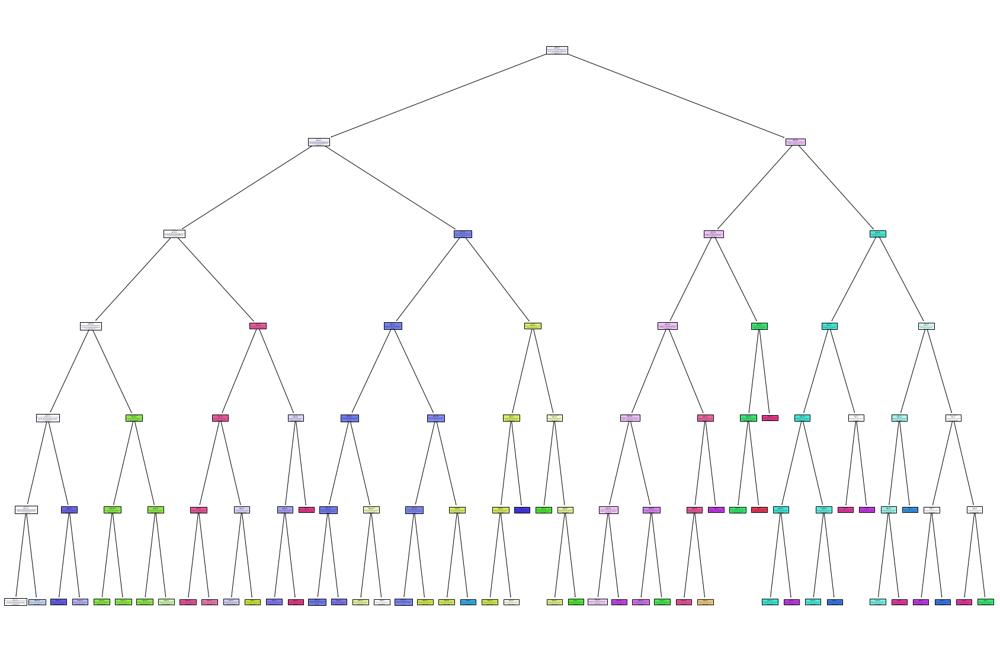

In [ ]:
fig = plt.figure(figsize=(30,20))
tree.plot_tree(tree_model, 
                   feature_names=dfmodel.columns,  
                   class_names=dfmodel['category'].unique(),
                   filled=True)

Aca podemos ver el árbol y vemos que los colores no son tan muy suaves como para que no le hayamos predecido a ninguna. 

In [ ]:
X_test["date"] = X_test["date"].values.astype('int')

In [ ]:
Y_pred = tree_model.predict(X_test)

In [ ]:
X_test

,date,0,1,2,3,4,5,6,7,8,...,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113
126111,1136525312,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
112548,-1633484800,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
85650,-1626472448,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
112842,-268566528,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
95590,-296615936,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62826,-1843855360,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
109635,242089984,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
130730,-275578880,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
82708,1448280064,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
print("Macro Average Recall:", balanced_accuracy_score(Y_test, Y_pred)*100, "%")

Macro Average Recall: 7.343899342243025 %


In [ ]:
def calculate_accuracy(un_arbol, X_test, Y_test):
  from sklearn.metrics import accuracy_score
  Y_prediction = un_arbol.predict(X_test)
  return accuracy_score(Y_prediction, Y_test)

In [ ]:
print("Accuracy:", calculate_accuracy(tree_model, X_test, Y_test)*100, "%")

Accuracy: 21.898477383685936 %


### Primera submision a kaggle

Ya tenemos nuestro primer modelo, ahora vamos a hacer nuestra primera entrega en kaggle

In [ ]:
dftest=pd.read_csv("new_classification_test.csv", sep = ",")
dftest['date'] = (dftest['date']).astype(str)
dftest['date'] = pd.to_numeric(dftest['date'].str.replace('-',''))
dftest['date'] = pd.to_datetime(dftest['date'], format='%Y%m%d')
dftest['date'] = dftest['date'].values.astype("int")
dftest['headline'] = dftest['headline'].fillna('')
corpus = dftest['headline']
headlineVecTest= vectorizer.transform(corpus)
headlineMatrix = headlineVecTest.toarray()
dftest = dftest.drop(columns=['short_description', 'headline', 'authors', 'id'])
dftest = pd.concat([dftest, pd.DataFrame(headlineMatrix)], axis=1)
dftest

In [ ]:
dftest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66282 entries, 0 to 66281
Columns: 3115 entries, date to 3113
dtypes: int32(1), int64(3114)
memory usage: 1.5 GB


In [ ]:
Y_pred = tree_model.predict(dftest)

In [ ]:
Y_pred_cat = pd.DataFrame(Y_pred)
Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat = Y_pred_cat["category"] 

Y_test_transformedBack = pd.DataFrame(Y_test)
Y_test_transformedBack["category"] = categoryOHE.inverse_transform(Y_test) 
Y_test_transformedBack = Y_test_transformedBack["category"] 

print("Macro Average Recall:", balanced_accuracy_score(Y_pred_cat, Y_test_transformedBack)*100, "%")

Macro Average Recall: 46.362743345317185 %


C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


In [ ]:
print(Y_pred)
print(len(Y_pred))

['POLITICS' 'POLITICS' 'DIVORCE' ... 'QUEER VOICES' 'POLITICS' 'POLITICS']
66282


In [ ]:
pd.DataFrame(data=Y_pred).to_csv("primeraEntrega.csv")

Ya tenemos nuestra primera baseline de MAR: 7.3% tanto local como en Kaggle
Por ahora solo los atributos que consideramos fueron: la date (que convertimos a int y que no quedo del todo bien) y el headlines que separamos en palabras con vectorizer
Puntos de mejora:
- Cambiar la date a algo más entendible, por ejemplo utc o cantidad de dias de utc
- Aplicar un stop_words al vectorizer que no nos dejo por aplicar el stemmer
- Probar usar un lemmer en vez de un stemmer
- Agregar el short_description y el autor a las features para predecir
- Probar una bag of words distintas: 
  - Probablemente tengamos que disminuir la cantidad para soportar más features (sino no creo que nos aguante la computadora)
  - Elegir palabras para cada categoria (probar si sirve más)
  - Agregar Tfldf
  - Agregar más features
- Usar cross validation / dev set
- Usar todos el train set (no hacer la separacion), para trainear los parametros para el test de kaggle. Esto me daria más datos para entrenar y por lo tanto bajar el bias. 

Para las features que se tomaron en cuenta, y tomando en cuenta que esto es una baseline, el resultado es bastante bien. 

### Ingeniería de atributos

Ahora el siguiente paso seria hacer ingeniera de atributos e intenter conseguir el mejor conjunto de atributos para despues aplicar modelos. 
Sin embargo, como sabemos que queremos hacer redes neuronales mas adelante. Vamos a empezar por ahi, asi tenemos una idea y medio una baseline de que es lo que puede hacer una red neuronal como pocos atributos. Especificamente vamos a usar solo el headlines. 
Esto nos va a permitir más adelante, cuando agregemos atributos ver si en serio sirven, por ejemplo agregandolos a la red neuronal que vamos a crear ahora. O ver si no aportan tanto. 

### Deep learning
Ahora vamos a probar crear una red neuronal y ver si su resultado es mejor

In [ ]:
# El df que tenemos hasta ahora
dfmodel

,date,category,0,1,2,3,4,5,6,7,...,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113
0,-999161856,RELIGION,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,-1230569472,WEDDINGS,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-2005794816,COMEDY,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,155385856,BUSINESS,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,228065280,ENTERTAINMENT,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,97386496,WELLNESS,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
134567,949747712,STYLE & BEAUTY,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134568,1404305408,PARENTING,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134569,-1930559488,TRAVEL,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Definiciones iniciales para todas las redes neuronales

In [ ]:
dfmodel["date"] = dfmodel["date"].values.astype('int')

In [ ]:
x = dfmodel.drop('category', axis=1)

categoriesTransform = dfmodel['category'].to_numpy()
categoriesTransform.shape
categoriesTransform = categoriesTransform.reshape(-1,1)
categoriesTransform.shape
categoryOHE = OneHotEncoder(handle_unknown='ignore')
y = categoryOHE.fit_transform(categoriesTransform)
y = y.toarray()

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(
    x,
    y,
    test_size=(1.0/3), random_state=42)

In [5]:
def make_NN_model(output_shapes, input_shape, use_bias, activations, dropouts, opt, loss, metric):
  model = Sequential()
  layers=len(output_shapes)
  for i in range(0, layers):
    if i == 0 : model.add(Dense(output_shapes[i], input_shape = (input_shape,), use_bias = use_bias))
    if i != 0 : model.add(Dense(output_shapes[i], use_bias = use_bias))
    model.add(Activation(activations[i]))
    if dropouts[i] != None : model.add(dropouts[i])
  model.compile(loss=loss, optimizer=opt, metrics=[metric])
  return model

Vamos a definir un earlyStopping, esto permite que el modelo no siga "bajando" mientras entrena. Esto evita el sobreajust, si no ponemos earlyStopping o la patience es muy alta, el modelo va a llegar a un punto donde baje el error y va a concentrarse ahi, hasta disminuir lo más posible el error de train o hasta que acaben las epochs. Esto tambien permite parar las epochs antes y consumir menos procesamiento si no es necesario

In [6]:
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=25)

#### Primera red neuronal
Es principalmente para reviar que funcione todo y tener un baseline de las redes neuronales para despues poder tomar decisiones a partir de los resultados iniciales
De vuelta, para este caso vamos a usar la date y el heading vectorizado

In [ ]:
model = make_NN_model(output_shapes=[20, 30, Y_train.shape[1]],
                      input_shape=len(X_train.columns),
                      use_bias=True,
                      activations=[LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                      dropouts=[Dropout(0.3), None, None],
                      opt='Adam',
                      loss='categorical_crossentropy',
                      metric=["categorical_accuracy", "Recall", "accuracy"])

In [ ]:
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_38 (Dense)             (None, 20)                62320     
_________________________________________________________________
activation_38 (Activation)   (None, 20)                0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 20)                0         
_________________________________________________________________
dense_39 (Dense)             (None, 30)                630       
_________________________________________________________________
activation_39 (Activation)   (None, 30)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 41)                1271      
_________________________________________________________________
activation_40 (Activation)   (None, 41)              

In [ ]:
training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 6s 8ms/step - loss: 818115.3125 - categorical_accuracy: 0.0405 - recall: 0.0405 - accuracy: 0.0405 - val_loss: 40881.6445 - val_categorical_accuracy: 0.0879 - val_recall: 0.0879 - val_accuracy: 0.0879
Epoch 2/500
718/718 [==============================] - 3s 5ms/step - loss: 72177.8906 - categorical_accuracy: 0.0461 - recall: 0.0461 - accuracy: 0.0461 - val_loss: 52687.7969 - val_categorical_accuracy: 0.0929 - val_recall: 0.0929 - val_accuracy: 0.0929
Epoch 3/500
718/718 [==============================] - 3s 4ms/step - loss: 45184.1992 - categorical_accuracy: 0.0487 - recall: 0.0487 - accuracy: 0.0487 - val_loss: 24263.5586 - val_categorical_accuracy: 0.0363 - val_recall: 0.0363 - val_accuracy: 0.0363
Epoch 4/500
718/718 [==============================] - 3s 4ms/step - loss: 28441.8613 - categorical_accuracy: 0.0511 - recall: 0.0510 - accuracy: 0.0511 - val_loss: 15957.1123 - val_categorical_accuracy: 0.0261 - val_recall: 0.0261 - 

Una vez que entrenamos el modelo es hora de usarlo para predecir el Y

In [ ]:
Y_pred = model.predict(X_test)

Vamos a revisar que el X_test haya quedado bien formateado 

In [ ]:
X_test

,date,0,1,2,3,4,5,6,7,8,...,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113
126111,1136525312,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
112548,-1633484800,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
85650,-1626472448,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
112842,-268566528,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
95590,-296615936,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62826,-1843855360,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
109635,242089984,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
130730,-275578880,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
82708,1448280064,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
def uniqueCategoriesPredicted(Y_pred):
  temp = pd.DataFrame(Y_pred)
  temp["col"] = categoryOHE.inverse_transform(Y_pred)
  return temp["col"].unique()


In [ ]:
uniqueCategoriesPredicted(Y_pred)

#### Segunda red neuronal: Sin date

Despues de entrenar el primre modelo, nos dimos cuenta que siempre se predecia "POLITICS", el cual es la categoria más frecuento. Esto problamente se va por un problema de mucho variance o que la fecha (el atributo más diferente) este afectando

Primero voy a probar con sacarle la fecha y ver si mejora. De esta manera, si hay un problema me puedo asegurar que no es culpa de los atributos, sino del modelo en si o un problema de programación

In [ ]:
X_trainNoDate = X_train.drop(columns=["date"])
X_testNoDate =X_test.drop(columns=["date"])

model = make_NN_model(output_shapes=[20, 30, Y_train.shape[1]],
                      input_shape=len(X_trainNoDate.columns),
                      use_bias=True,
                      activations=[LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                      dropouts=[Dropout(0.3), None, None],
                      opt='Adam',
                      loss='categorical_crossentropy',
                      metric=["categorical_accuracy", "Recall", "accuracy"])

training = model.fit(X_trainNoDate, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 6s 9ms/step - loss: 2.8043 - categorical_accuracy: 0.2954 - recall: 0.1005 - accuracy: 0.2954 - val_loss: 2.2466 - val_categorical_accuracy: 0.4358 - val_recall: 0.1981 - val_accuracy: 0.4358
Epoch 2/500
718/718 [==============================] - 4s 5ms/step - loss: 2.1637 - categorical_accuracy: 0.4450 - recall: 0.2324 - accuracy: 0.4450 - val_loss: 2.0320 - val_categorical_accuracy: 0.4740 - val_recall: 0.2740 - val_accuracy: 0.4740
Epoch 3/500
718/718 [==============================] - 4s 5ms/step - loss: 1.9999 - categorical_accuracy: 0.4800 - recall: 0.2768 - accuracy: 0.4800 - val_loss: 1.9612 - val_categorical_accuracy: 0.4858 - val_recall: 0.3020 - val_accuracy: 0.4858
Epoch 4/500
718/718 [==============================] - 3s 5ms/step - loss: 1.9108 - categorical_accuracy: 0.4972 - recall: 0.2994 - accuracy: 0.4972 - val_loss: 1.9245 - val_categorical_accuracy: 0.4950 - val_recall: 0.3200 - val_accuracy: 0.4950
Epoch 5/500


In [ ]:
Y_pred = model.predict(X_testNoDate)
uniqueCategoriesPredicted(Y_pred)

array(['COMEDY', 'TRAVEL', 'CRIME', 'POLITICS', 'WEDDINGS',
       'QUEER VOICES', 'BLACK VOICES', 'RELIGION', 'BUSINESS',
       'ENVIRONMENT', 'ENTERTAINMENT', 'FOOD & DRINK', 'WELLNESS',
       'PARENTING', 'GREEN', 'TECH', 'STYLE & BEAUTY', 'HOME & LIVING',
       'SCIENCE', 'SPORTS', 'DIVORCE', 'IMPACT', 'WOMEN', 'THE WORLDPOST',
       'HEALTHY LIVING', 'STYLE', 'WORLDPOST', 'EDUCATION', 'WEIRD NEWS',
       'MEDIA', 'LATINO VOICES', 'CULTURE & ARTS', 'COLLEGE', 'MONEY',
       'GOOD NEWS', 'PARENTS', 'ARTS', 'TASTE', 'ARTS & CULTURE'],
      dtype=object)

Ahora si, las predicciones parecen mejores, ahora no se predice siempre POLITICS. Ahora vamos calcular la MAR. Primero tenemos que pasar lo que se transoformo con One Hot Enconder a la category que estaba antes. 

In [ ]:
Y_pred_cat = pd.DataFrame(Y_pred)
Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat = Y_pred_cat["category"] 

Y_test_transformedBack = pd.DataFrame(Y_test)
Y_test_transformedBack["category"] = categoryOHE.inverse_transform(Y_test) 
Y_test_transformedBack = Y_test_transformedBack["category"] 

print("Macro Average Recall:", balanced_accuracy_score(Y_pred_cat, Y_test_transformedBack)*100, "%")

Macro Average Recall: 46.362743345317185 %


C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


Llegamos a un MAR de 46.3% en nuestros datos de test. Ahora hay que probarlos con los datos de Kaggle. 

In [ ]:
dftest=pd.read_csv("new_classification_test.csv", sep = ",")
dftest['headline'] = dftest['headline'].fillna('')
corpus = dftest['headline']
headlineVecTest= vectorizer.transform(corpus)
headlineMatrix = headlineVecTest.toarray()
dftest = dftest.drop(columns=['short_description', 'headline', 'authors', 'id', 'date'])
dftest = pd.concat([dftest, pd.DataFrame(headlineMatrix)], axis=1)
dftest

,0,1,2,3,4,5,6,7,8,9,...,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66277,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66278,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66279,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66280,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
Y_pred = model.predict(dftest)

In [ ]:
Y_pred

array([[2.70442199e-03, 2.37413235e-02, 5.62266400e-03, ...,
        1.92609176e-01, 1.19333956e-04, 6.08906776e-05],
       [3.00717074e-03, 3.04317987e-03, 4.87729572e-02, ...,
        1.11251380e-02, 6.00473315e-04, 7.11533648e-04],
       [9.22016613e-03, 1.38498365e-03, 5.49396151e-04, ...,
        3.87905020e-05, 1.28958391e-05, 2.24236846e-05],
       ...,
       [3.11915129e-02, 2.64616646e-02, 1.73606866e-04, ...,
        2.22287583e-03, 3.54904158e-04, 1.98645677e-04],
       [1.80801528e-03, 4.20342060e-03, 3.61201651e-02, ...,
        6.92137629e-02, 1.02635026e-02, 1.25637231e-02],
       [1.62810849e-07, 8.29650926e-09, 6.85063867e-07, ...,
        8.92390631e-07, 1.86003102e-10, 2.57596411e-09]], dtype=float32)

In [ ]:
Y_pred_cat = pd.DataFrame(Y_pred)
Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat = Y_pred_cat["category"] 

pd.DataFrame(data=Y_pred_cat).to_csv("segundaEntregaNN.csv")

El resultado de esta segunda entrega en Kaggle fue de 33%, una mejora sobre el 7% anterior. 
Esto nos confirma nuestra idea de usar redes neuronales basicas para tener una baseline de las mismas. Ahora que sabemos a cuanto podemos llegar sin muchos atributos o mejoras a las redes neuronales, falta mejorar las mismas y los otros modelos. 
Ahora podemos agregar más atributos, una opción seria la short_description, aunque hay que tener cuidado porque usar vectorización va a llevar a una gran cantidad extras de agrumentos y eso va a llevar a más tiempo entrenando los modelos.  

#### Mejorar el bag of word

Tomando en cuenta que la red neuronal anterior tuvo un rendimiento razonable, y que ademas los unicos atributos que se usaron para entrenarla fueron las words de  los heading, una opción seria mejorar dicha selección de palabras. Algo que puede estar ocurriendo es que exitan palabras que se vinculen mucho a alguna categoria pero que no pertenezcan al bag of words. Por ejemplo "skin" podria estar muy relacionada a "beauty" pero si "beauty" no es popular, "skin" probablemente no aparezca en la lista de palabras. 
Esto se debe a que la distibución de categorias no es uniforme, como mostramos al principio, palabras muy vinculas a politics son más probable de aparecer que de una categoria menos frecuente. 

Por lo tanto se planteo probar la siguiente idea: 

En vez elegir las palabras sin tomar en cuenta la categoria, agarrar las "n" palabras de cada categoria. Esto permitiria incluir palabras muy relacionadas a alguna categoria (por lo tanto ayudaria a predecir dicha categoria) pero que ahora no aparecen. 

Tomando en cuenta que el total de palabras es 47264, que el modelo funciono bien con 3114 y que la cantidad de categorias son 41, vamos a empezar agarrando el top 80 de palabras de cada categoria. 

Como siempre, esto es una prueba, en base a las observaciones que vimos, puede o no mejorar el modelo. Ahora que ya tenemos un par de modelos de referencia es buen momento para probar distintas ideas y ver su resultado. 

In [ ]:
df

,headline,authors,short_description,date,category
0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION
1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS
2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY
3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS
4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT
...,...,...,...,...,...
134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS
134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY
134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING
134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL


In [ ]:
categories = df['category'].unique()
categories

['RELIGION', 'WEDDINGS', 'COMEDY', 'BUSINESS', 'ENTERTAINMENT', ..., 'ARTS', 'MONEY', 'LATINO VOICES', 'FIFTY', 'EDUCATION']
Length: 41
Categories (41, object): ['RELIGION', 'WEDDINGS', 'COMEDY', 'BUSINESS', ..., 'MONEY', 'LATINO VOICES', 'FIFTY', 'EDUCATION']

In [ ]:
vectorizer = CountVectorizer()
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer(language = 'english')
analyzer = CountVectorizer().build_analyzer()

def stemmed_words(doc):
    return (stemmer.stem(w) for w in analyzer(doc))

vectorizer = CountVectorizer(max_features=80,min_df= 50, analyzer = stemmed_words)

full_list = []

for category in categories: 
    print("CATEGORY: ", category)
    corpus = df['headline'][df["category"] == category] 
    vectorizer.fit(corpus)
    print(vectorizer.get_feature_names())
    print(len(vectorizer.get_feature_names()))
    headlineVecTrain = vectorizer.transform(corpus)
    headlineMatrix = headlineVecTrain.toarray()




CATEGORY:  RELIGION
['about', 'american', 'an', 'and', 'are', 'at', 'be', 'cathol', 'christian', 'church', 'daili', 'faith', 'for', 'franci', 'from', 'god', 'how', 'in', 'is', 'it', 'medit', 'muslim', 'new', 'not', 'of', 'on', 'pope', 'religi', 'religion', 'the', 'this', 'to', 'what', 'whi', 'with', 'you']
36
CATEGORY:  WEDDINGS
['10', 'about', 'and', 'are', 'at', 'be', 'best', 'big', 'bridal', 'bride', 'can', 'celebr', 'coupl', 'day', 'do', 'don', 'dress', 'engag', 'for', 'from', 'get', 'got', 'have', 'how', 'idea', 'in', 'is', 'it', 'love', 'make', 'marri', 'marriag', 'my', 'not', 'of', 'on', 'one', 'photo', 'plan', 'propos', 'real', 'reveal', 'ring', 'say', 'should', 'that', 'the', 'their', 'thing', 'this', 'tip', 'to', 'trend', 'video', 'way', 'wed', 'what', 'whi', 'who', 'will', 'with', 'year', 'you', 'your']
64
CATEGORY:  COMEDY
['about', 'all', 'an', 'and', 'are', 'as', 'at', 'be', 'bee', 'best', 'bill', 'by', 'can', 'colbert', 'conan', 'day', 'donald', 'fallon', 'for', 'from', 

Aca ya vimos algunos problemas: 
  - No todas las categorias tienen 80 palabras, lo cual no es un problema en sí, pero si puede segnificar que le pusimos un minimo muy bajo de frecuencia a las palabras
  - Muchas de las palabras son stop words. Habiamos sacado las stop words porque el stemmer las ignoraba. Vamos a tener que buscar como arreglarlo para mejorar el modelo

In [ ]:
vectorizer = CountVectorizer()
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer 
import nltk
import string
nltk.download('punkt')
nltk.download('wordnet')

lemmer = WordNetLemmatizer()
analyzer = CountVectorizer().build_analyzer()

from nltk.corpus import stopwords
nltk.download('stopwords')
stops = set(stopwords.words('english'))
#print(stops)

from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
custom_stop_word = set('q,w,e,r,t,y,u,i,o,p,a,s,d,f,g,h,j,k,l,z,x,c,v,b,n,m,and,\'\',--,``'.split(','))
# Al principio habiamos incluido "`s" como stop word, pero la sacamos porque 
# pensamos que podria tener que ver con que tan informal es el texto, tambien sacamos los numeros para tener en cuenta
# los 'top 10 cosas..' que vimos en los heading en el analisis inicial
combine_stop_words = stops.union(string.punctuation).union(ENGLISH_STOP_WORDS).union(custom_stop_word)
stop_words = set([lemmer.lemmatize(t) for t in combine_stop_words]).union(combine_stop_words).union(custom_stop_word)

def lemmed_words(doc):
    return (lemmer.lemmatize(t.lower()) for t in word_tokenize(doc) if t.lower() not in stop_words)


vectorizer = CountVectorizer(max_features=80,analyzer = lemmed_words)
full_list = []

for category in categories: 
    corpus = df['headline'][df["category"] == category] 
    vectorizer.fit(corpus)
    for word in vectorizer.get_feature_names():
        if word not in full_list:
            full_list.append(word)
    print("CATEGORY: ", category, '| Se agregaron ', len(vectorizer.get_feature_names()), ' features' )
print(full_list)
print(len(full_list))


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ivanm\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ivanm\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ivanm\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


CATEGORY:  RELIGION | Se agregaron  80  features
CATEGORY:  WEDDINGS | Se agregaron  80  features
CATEGORY:  COMEDY | Se agregaron  80  features
CATEGORY:  BUSINESS | Se agregaron  80  features
CATEGORY:  ENTERTAINMENT | Se agregaron  80  features
CATEGORY:  DIVORCE | Se agregaron  80  features
CATEGORY:  QUEER VOICES | Se agregaron  80  features
CATEGORY:  TRAVEL | Se agregaron  80  features
CATEGORY:  CULTURE & ARTS | Se agregaron  80  features
CATEGORY:  WORLDPOST | Se agregaron  80  features
CATEGORY:  IMPACT | Se agregaron  80  features
CATEGORY:  BLACK VOICES | Se agregaron  80  features
CATEGORY:  WELLNESS | Se agregaron  80  features
CATEGORY:  HEALTHY LIVING | Se agregaron  80  features
CATEGORY:  WORLD NEWS | Se agregaron  80  features
CATEGORY:  WOMEN | Se agregaron  80  features
CATEGORY:  PARENTING | Se agregaron  80  features
CATEGORY:  PARENTS | Se agregaron  80  features
CATEGORY:  SCIENCE | Se agregaron  80  features
CATEGORY:  ENVIRONMENT | Se agregaron  80  features


Originalmente probamos con 50 min_df y nos dio 517. Asi que probamos con 20 min_df 937. Nos dimos cuenta que tenia más sentido probar con un df_min que sea un procentaje, ya que la cantidad de 1108. Tambien probamos con 0.005 lo cual nos daban 80 features por categoria. Pero como algunas se repetian, quedaron en 1190. Como se cumplia antes el max features antes que el min_df, sacamos el min_df ya que no cambia el resultado. 

In [ ]:
dftemp = df.copy()

In [ ]:
for word in full_list:
  dftemp[word] = dftemp['headline'].str.count(word)
dftemp

,headline,authors,short_description,date,category,'s,abuse,america,american,archbishop,...,learn,learning,reform,search,standard,start,teacher,teaching,tenure,testing
0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,0,RELIGION,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,0,WEDDINGS,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,0,COMEDY,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,0,BUSINESS,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,0,ENTERTAINMENT,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,0,WELLNESS,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,0,STYLE & BEAUTY,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,0,PARENTING,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",0,TRAVEL,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Ahora ya tengo mi matriz con las las headlines vectorizadas. Ahora vamos a aplicar la misma red que hicimos antes. 

In [ ]:
dftemp2 = dftemp.copy()
dftemp2 = dftemp2.drop('authors', axis = 1)
dftemp2 = dftemp2.drop('date', axis = 1)
dftemp2 = dftemp2.drop('short_description', axis = 1)
dftemp2 = dftemp2.drop('headline', axis = 1)

x = dftemp2.drop('category', axis = 1)
x

categoriesTransform = dftemp['category'].to_numpy()
categoriesTransform.shape
categoriesTransform = categoriesTransform.reshape(-1,1)
categoriesTransform.shape
categoryOHE = OneHotEncoder(handle_unknown='ignore')
y = categoryOHE.fit_transform(categoriesTransform)
y = y.toarray()

X_train, X_test, Y_train, Y_test = train_test_split(
    x,
    y,
    test_size=(1.0/3), random_state=42)

model = make_NN_model(output_shapes=[20, 30, Y_train.shape[1]],
                      input_shape=len(X_train.columns),
                      use_bias=True,
                      activations=[LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                      dropouts=[Dropout(0.3), None, None],
                      opt='Adam',
                      loss='categorical_crossentropy',
                      metric=["categorical_accuracy", "Recall", "accuracy"])

training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 3s 4ms/step - loss: 3.2903 - categorical_accuracy: 0.1681 - recall: 0.0024 - accuracy: 0.1681 - val_loss: 3.1877 - val_categorical_accuracy: 0.1944 - val_recall: 0.0076 - val_accuracy: 0.1944
Epoch 2/500
718/718 [==============================] - 2s 2ms/step - loss: 3.1559 - categorical_accuracy: 0.1985 - recall: 0.0125 - accuracy: 0.1985 - val_loss: 3.1181 - val_categorical_accuracy: 0.2046 - val_recall: 0.0139 - val_accuracy: 0.2046
Epoch 3/500
718/718 [==============================] - 1s 2ms/step - loss: 3.1115 - categorical_accuracy: 0.2082 - recall: 0.0159 - accuracy: 0.2082 - val_loss: 3.0815 - val_categorical_accuracy: 0.2170 - val_recall: 0.0173 - val_accuracy: 0.2170
Epoch 4/500
718/718 [==============================] - 2s 2ms/step - loss: 3.0819 - categorical_accuracy: 0.2164 - recall: 0.0181 - accuracy: 0.2164 - val_loss: 3.0608 - val_categorical_accuracy: 0.2214 - val_recall: 0.0205 - val_accuracy: 0.2214
Epoch 5/500


In [ ]:
Y_pred = model.predict(X_test)

In [ ]:
Y_pred_cat = pd.DataFrame(Y_pred)
Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat = Y_pred_cat["category"] 

Y_test_transformedBack = pd.DataFrame(Y_test)
Y_test_transformedBack["category"] = categoryOHE.inverse_transform(Y_test) 
Y_test_transformedBack = Y_test_transformedBack["category"] 

print("Macro Average Recall:", balanced_accuracy_score(Y_pred_cat, Y_test_transformedBack)*100, "%")

Macro Average Recall: 23.74700720825573 %


C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


El resultado nos dio 23% lo cual fue peor que usar las palabras más frecuentes. Tenemos dos opciones: 
- Mejorar la red neuronal
- Combinar ambos set de features
- Hacer ambas

Vamos a ir por la segunda, principalmente para ver si agregar estas features mejora o no mejora. 


In [ ]:
#dfAmbasWordBag = dftemp2.join(pd.DataFrame(headlineMatrix_countVectorizer))
#dfAmbasWordBag

Inicialmente habiamos juntados ambos datasets lo cual nos dejo ver que hay 4304 columnas = 1190 de las palabras elegidas por categoria + 3114 de las palabras que conseguimos al principio con el countVectoraizer de todo. 
Sin embargo pueden haber columnas repetidas en caso que una misma palabra se haya elegido en ambos casos
Por lo tanto decidimos de sacar dichas columnas. 
Esta parte del código se saco ya que se encontró una manera más rapida de hacerlo y sino, habia problema con la RAM. Por eso se comento el código de arriba. Abajo es el código que nos habia dado. 

In [ ]:
#dfAmbasWordBag

,category,'s,abuse,america,american,bishop,black,child,church,day,...,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113
0,RELIGION,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,WEDDINGS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,COMEDY,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,BUSINESS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,ENTERTAINMENT,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,WELLNESS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134567,STYLE & BEAUTY,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134568,PARENTING,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134569,TRAVEL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Vamos a conseguir la lista de palabras que solo esta en la lista nueva (las conseguidas por categoria)
newWordsWithoutOldOnes = list(set(full_list) - set(original_word)) 
print(newWordsWithoutOldOnes)
len(newWordsWithoutOldOnes)


['journalism', 'insurance', 'magazine', 'george', 'senate', 'breastfeeding', 'reporter', 'post-split', 'presidential', 'researcher', 'aging', 'touchdown', "'star", 'playoff', 'sandy', 'bridesmaid', 'gawker', 'baseball', 'immigrant', 'divorce', 'future', 'eclipse', 'lady', 'candidate', 'anniversary', 'texas', 'environmental', 'commencement', "n't", 'fracking', 'abuse', 'islamophobia', 'medium', 'learned', 'irs', 'valentine', 'bible', 'education', 'extreme', 'rabbi', 'nyt', 'meditation', 'gina', '‘', 'abortion', 'reality', 'try', 'getting', 'reflection', 'same-sex', 'for-profit', 'digital', 'celebrity', 'curry', 'hispanic', 'photography', 'iphone', 'vintage', 'fitness', 'political', 'refugee', 'hurricane', 'explores', 'exhibition', 'francis', 'policy', 'telescope', 'fark', 'divorced', 'mystery', 'rohingya', 'mommy', 'cooky', 'opera', 'mizzou', 'picture', 'democratic', "'the", 'nuptials', 'pregnancy', "'m", 'study', 'helping', 'innovation', 'restaurant', 'spanish', 'starbucks', 'election'

454

Sacando las columnas repeditas vemos que agregar las palabras por categoria nos agrega 454 palabras nuevas. No es mucho, pero vamos a probar si mejora o no el modelo. 

In [ ]:
dfWithBothWords = dfmodel.drop('date', axis = 1)
dfWithBothWords['headline'] = df['headline']
dfWithBothWords

,category,0,1,2,3,4,5,6,7,8,...,3105,3106,3107,3108,3109,3110,3111,3112,3113,headline
0,RELIGION,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,Does Romans 13 Give The President The Right To...
1,WEDDINGS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,How To Throw A Marijuana-Friendly Wedding
2,COMEDY,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,The New Yorker Finally Realized Us Plebeians D...
3,BUSINESS,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,The 10 Best U.S. Cities For Retirement
4,ENTERTAINMENT,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"Justin Bieber Punches Man In The Face, Leaves ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,WELLNESS,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,Added Sugars Make Up 13 Percent Of U.S. Adults...
134567,STYLE & BEAUTY,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Must-Try Bohemian Trends
134568,PARENTING,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,From A Dad Who Supports Breastfeeding: My Boys...
134569,TRAVEL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"Bikinis, Texas: Businessman Buys Bankersmith, ..."


In [ ]:
for word in newWordsWithoutOldOnes:
  dfWithBothWords[word] = dfWithBothWords['headline'].str.count(word)
dfWithBothWords

,category,0,1,2,3,4,5,6,7,8,...,hillary,judge,mlb,spacecraft,catholic,7,arrested,middle,favorite,minister
0,RELIGION,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,WEDDINGS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,COMEDY,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,BUSINESS,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,ENTERTAINMENT,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,WELLNESS,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
134567,STYLE & BEAUTY,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134568,PARENTING,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
134569,TRAVEL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
dfWithBothWords = dfmodel.drop('headline', axis = 1)

In [ ]:
x = dfWithBothWords.drop('category', axis = 1)
x

categoriesTransform = dfWithBothWords['category'].to_numpy()
categoriesTransform.shape
categoriesTransform = categoriesTransform.reshape(-1,1)
categoriesTransform.shape
categoryOHE = OneHotEncoder(handle_unknown='ignore')
y = categoryOHE.fit_transform(categoriesTransform)
y = y.toarray()

X_train, X_test, Y_train, Y_test = train_test_split(
    x,
    y,
    test_size=(1.0/3), random_state=42)



In [ ]:
X_train

,0,1,2,3,4,5,6,7,8,9,...,hillary,judge,mlb,spacecraft,catholic,7,arrested,middle,favorite,minister
28023,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
113093,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
72033,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
130854,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
72557,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110268,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
119879,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
103694,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
131932,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
model = make_NN_model(output_shapes=[20, 30, Y_train.shape[1]],
                      input_shape=len(X_train.columns),
                      use_bias=True,
                      activations=[LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                      dropouts=[Dropout(0.3), None, None],
                      opt='Adam',
                      loss='categorical_crossentropy',
                      metric=["categorical_accuracy", "Recall", "accuracy"])

training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 5s 7ms/step - loss: 2.9325 - categorical_accuracy: 0.2597 - recall: 0.0692 - accuracy: 0.2597 - val_loss: 2.3606 - val_categorical_accuracy: 0.4145 - val_recall: 0.1674 - val_accuracy: 0.4145
Epoch 2/500
718/718 [==============================] - 4s 5ms/step - loss: 2.2302 - categorical_accuracy: 0.4290 - recall: 0.2168 - accuracy: 0.4290 - val_loss: 2.0713 - val_categorical_accuracy: 0.4592 - val_recall: 0.2706 - val_accuracy: 0.4592
Epoch 3/500
718/718 [==============================] - 3s 5ms/step - loss: 2.0112 - categorical_accuracy: 0.4750 - recall: 0.2751 - accuracy: 0.4750 - val_loss: 1.9577 - val_categorical_accuracy: 0.4878 - val_recall: 0.3032 - val_accuracy: 0.4878
Epoch 4/500
718/718 [==============================] - 3s 5ms/step - loss: 1.9030 - categorical_accuracy: 0.4994 - recall: 0.3040 - accuracy: 0.4994 - val_loss: 1.9162 - val_categorical_accuracy: 0.4966 - val_recall: 0.3190 - val_accuracy: 0.4966
Epoch 5/500


In [ ]:
Y_pred = model.predict(X_test)

In [ ]:
Y_pred_cat = pd.DataFrame(Y_pred)
Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat = Y_pred_cat["category"] 

Y_test_transformedBack = pd.DataFrame(Y_test)
Y_test_transformedBack["category"] = categoryOHE.inverse_transform(Y_test) 
Y_test_transformedBack = Y_test_transformedBack["category"] 

print("Macro Average Recall:", balanced_accuracy_score(Y_pred_cat, Y_test_transformedBack)*100, "%")

Macro Average Recall: 47.74293447524339 %


El MAR mejoro un 1% con la red neuronal anterior que no incluia las palabras por categoria. 
Lo cual no es muy sustancial y problamente inidque que si bien no fue mala idea, si se vuelve muy grande el dataset, no vale la pena combinarlos 

Ahora vamos a probaro con los datos de kaggle. Primero tenemos que realizarle las transoformacion que habiamos hecho antes. 

In [ ]:
dftest=pd.read_csv("new_classification_test.csv", sep = ",")
dftest['headline'] = dftest['headline'].fillna('')
corpus = dftest['headline']

for word in newWordsWithoutOldOnes:
  dftest[word] = dftest['headline'].str.count(word)

headlineVecTest= vectorizer.transform(corpus)
headlineMatrix = headlineVecTest.toarray()
dftest = dftest.drop(columns=['short_description', 'headline', 'authors', 'id', 'date'])
dftest = pd.concat([ pd.DataFrame(headlineMatrix), dftest,], axis=1)
dftest

,0,1,2,3,4,5,6,7,8,9,...,hillary,judge,mlb,spacecraft,catholic,7,arrested,middle,favorite,minister
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66277,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66278,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66279,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66280,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
Y_pred = model.predict(dftest)

In [ ]:
Y_pred_cat = pd.DataFrame(Y_pred)
Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat = Y_pred_cat["category"] 

pd.DataFrame(data=Y_pred_cat).to_csv("terceraEntregaNN.csv")

Una vez subido a Kaggle nos dio 33.381%, una pequeña mejora sobre el anterior (33.050%). Esto se puede dar por dos razones: 
- Las nuevas features agregadas dan valor al modelo y ayudan a mejorar la predicción
- Agregar más palabras (salgan de donde salgan) mejoran el modelo

Por lo tanto: 
Vamos a probar agregando más palabras y ver cuanto mejora
	

### Siguiente intento:  Más palabras

In [ ]:
del(dfWithBothWords)

In [ ]:
df = reload_df()
df

,headline,authors,short_description,date,category
0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION
1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS
2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY
3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS
4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT
...,...,...,...,...,...
134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS
134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY
134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING
134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL


In [ ]:
corpus = df['headline']
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer(language = 'english')
analyzer = CountVectorizer().build_analyzer()

def stemmed_words(doc):
    return (stemmer.stem(w) for w in analyzer(doc))


In [ ]:
# Aumentamos el max_features 
vectorizer = CountVectorizer(max_features=8000, analyzer = stemmed_words)
vectorizer.fit(corpus)

print(len(vectorizer.get_feature_names()))

headlineMatrix = vectorizer.transform(corpus).toarray()

8000


In [ ]:
dfmodel = df.copy(deep=True)
dfmodel = dfmodel.drop(columns=['short_description', 'headline', 'authors', 'date'])

dfmodel = dfmodel.join(pd.DataFrame(headlineMatrix))

x = dfmodel.drop('category', axis=1)

categoriesTransform = dfmodel['category'].to_numpy()
categoriesTransform.shape
categoriesTransform = categoriesTransform.reshape(-1,1)
categoriesTransform.shape
categoryOHE = OneHotEncoder(handle_unknown='ignore')
y = categoryOHE.fit_transform(categoriesTransform)
y = y.toarray()

X_train, X_test, Y_train, Y_test = train_test_split(
    x,
    y,
    test_size=(1.0/3), random_state=42)

In [ ]:

model = make_NN_model(output_shapes=[20, 30, Y_train.shape[1]],
                  input_shape=len(X_train.columns),
                  use_bias=True,
                  activations=[LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                  dropouts=[Dropout(0.3), None, None],
                  opt='Adam',
                  loss='categorical_crossentropy',
                  metric=["categorical_accuracy", "Recall", "accuracy"])

training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)



Epoch 1/500
718/718 [==============================] - 21s 29ms/step - loss: 2.7469 - categorical_accuracy: 0.3104 - recall: 0.1080 - accuracy: 0.3104 - val_loss: 2.1877 - val_categorical_accuracy: 0.4461 - val_recall: 0.2135 - val_accuracy: 0.4461
Epoch 2/500
718/718 [==============================] - 5s 8ms/step - loss: 2.0519 - categorical_accuracy: 0.4686 - recall: 0.2525 - accuracy: 0.4686 - val_loss: 1.9316 - val_categorical_accuracy: 0.4980 - val_recall: 0.3018 - val_accuracy: 0.4980
Epoch 3/500
718/718 [==============================] - 6s 8ms/step - loss: 1.8178 - categorical_accuracy: 0.5186 - recall: 0.3180 - accuracy: 0.5186 - val_loss: 1.8459 - val_categorical_accuracy: 0.5156 - val_recall: 0.3406 - val_accuracy: 0.5156
Epoch 4/500
718/718 [==============================] - 5s 8ms/step - loss: 1.6769 - categorical_accuracy: 0.5469 - recall: 0.3551 - accuracy: 0.5469 - val_loss: 1.8126 - val_categorical_accuracy: 0.5246 - val_recall: 0.3590 - val_accuracy: 0.5246
Epoch 5/50

In [ ]:
Y_pred = model.predict(X_test)

Y_pred_cat = pd.DataFrame(Y_pred)
Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat = Y_pred_cat["category"] 

Y_test_transformedBack = pd.DataFrame(Y_test)
Y_test_transformedBack["category"] = categoryOHE.inverse_transform(Y_test) 
Y_test_transformedBack = Y_test_transformedBack["category"] 

print("Macro Average Recall:", balanced_accuracy_score(Y_pred_cat, Y_test_transformedBack)*100, "%")

Macro Average Recall: 47.609923327841635 %


Al aumentarle la cantidad de palabras el MAR se mantuvo alreadedor de 47%. Esto nos indica que probablemente: 
- Agregarle más palabras no ayude mucho al problema
- Necesitamos buscar otro forma de precedir mejor, algunas opciones serian:
  - Mejorar la red neuronal
  - Agregar más features distintas (por ejemplo usar short_description)
  - Usar otro modelo

Primero vamos  intentar con la primera, y despues si pasar a las otras dos

De todos modos antes vamos a subirlo a kaggle

In [ ]:
dftest=pd.read_csv("new_classification_test.csv", sep = ",")
dftest['headline'] = dftest['headline'].fillna('')
corpus = dftest['headline']
headlineVecTest= vectorizer.transform(corpus)
headlineMatrix = headlineVecTest.toarray()
dftest = dftest.drop(columns=['short_description', 'headline', 'authors', 'id', 'date'])
dftest = pd.DataFrame(headlineMatrix)
dftest

,0,1,2,3,4,5,6,7,8,9,...,7990,7991,7992,7993,7994,7995,7996,7997,7998,7999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66277,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66278,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66279,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66280,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
Y_pred_kaggle = model.predict(dftest)

In [ ]:
Y_pred_cat_kaggle = pd.DataFrame(Y_pred)
Y_pred_cat_kaggle["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat_kaggle = Y_pred_kaggle["category"] 

pd.DataFrame(data=Y_pred_cat_kaggle).to_csv("cuartaEntregaNN.csv")

Se subio a Kaggle y si bien hubo una mejora no fue sustancial

Por lo tanto ahora vamos a pasar a intentar mejorar la red neuronal(cambiando la cantidad de capaz por ejemplo) y depues si a agregar más features

Primero queremos detectar cual fue el problema de nuestro modelo
Por ejemplo si la acurracy en test es muy buena pero en test muy mala, probablemente sea overfitting y tengamos que intentar bajar la varianza, por ejemplo con regularazación
La acurracy del train te lo imprime el modelo, pero todavia no calculamos la del test. Asi que primero vamos a hacer eso

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(Y_test_transformedBack, Y_pred_cat)

0.5387787859197004

La acurracy del test nos dio 54% y la del train (sacada del print de la red) nos dio 52%. Por lo tanto no estamos viendo un caso de overfitting.
En consequencia, vamos a aumentar de la compejidad del modelo para intentar que "memorize" mejor los datos, intentando no pasarnos y que aumente mucho la varianza. 

In [ ]:
# Hacemos un nuevo modelo cambiando el output_shape que representa los tamaño de las capas densas internas
# Originalmente 20,30, si agregamos mas capas tambien hay que agregar mas funciones de activacion
model = make_NN_model(output_shapes=[20, 30, 50, 70, 90,  Y_train.shape[1]],
                  input_shape=len(X_train.columns),
                  use_bias=True,
                  activations=[LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                  dropouts=[Dropout(0.3), None, None,None,None,None],
                  opt='Adam',
                  loss='categorical_crossentropy',
                  metric=["categorical_accuracy", "Recall", "accuracy"])
                  
# Imprimo el modelo para verlo más graficamente
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 20)                160020    
_________________________________________________________________
activation_16 (Activation)   (None, 20)                0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 20)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 30)                630       
_________________________________________________________________
activation_17 (Activation)   (None, 30)                0         
_________________________________________________________________
dense_20 (Dense)             (None, 50)                1550      
_________________________________________________________________
activation_18 (Activation)   (None, 50)               

In [ ]:
training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 66s 93ms/step - loss: 2.6445 - categorical_accuracy: 0.3229 - recall: 0.1428 - accuracy: 0.3229 - val_loss: 2.1557 - val_categorical_accuracy: 0.4416 - val_recall: 0.2620 - val_accuracy: 0.4416
Epoch 2/500
718/718 [==============================] - 5s 7ms/step - loss: 2.0499 - categorical_accuracy: 0.4599 - recall: 0.2795 - accuracy: 0.4599 - val_loss: 1.9976 - val_categorical_accuracy: 0.4817 - val_recall: 0.2885 - val_accuracy: 0.4817
Epoch 3/500
718/718 [==============================] - 5s 7ms/step - loss: 1.8599 - categorical_accuracy: 0.5016 - recall: 0.3236 - accuracy: 0.5016 - val_loss: 1.9632 - val_categorical_accuracy: 0.4851 - val_recall: 0.3263 - val_accuracy: 0.4851
Epoch 4/500
718/718 [==============================] - 5s 7ms/step - loss: 1.7591 - categorical_accuracy: 0.5211 - recall: 0.3496 - accuracy: 0.5211 - val_loss: 1.9403 - val_categorical_accuracy: 0.4958 - val_recall: 0.3324 - val_accuracy: 0.4958
Epoch 5/50

Como vamos a estar probando varias redes neuronales, vamos  a hacer una funcion para simiplificar el conseguir el resultado del test. 

In [8]:
from sklearn.metrics import accuracy_score

def print_prediction(X_test,Y_pred, Y_test ):
  Y_pred = model.predict(X_test)

  Y_pred_cat = pd.DataFrame(Y_pred)
  Y_pred_cat["category"] = categoryOHE.inverse_transform(Y_pred)
  Y_pred_cat = Y_pred_cat["category"] 

  Y_test_transformedBack = pd.DataFrame(Y_test)
  Y_test_transformedBack["category"] = categoryOHE.inverse_transform(Y_test) 
  Y_test_transformedBack = Y_test_transformedBack["category"] 

  print("Macro Average Recall:", balanced_accuracy_score(Y_pred_cat, Y_test_transformedBack)*100, "%")
  print("Acurracy Socre: ", accuracy_score(Y_test_transformedBack, Y_pred_cat)*100, "%")

In [ ]:
print_prediction(X_test,Y_pred, Y_test)

C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


Macro Average Recall: 42.28317449903757 %
Acurracy Socre:  51.505896515593996 %


El MAR y la acurracy del model dieron peores. Por lo tanto vamos a seguir probando distintas redes y si vemos que no hay una mejora sustancial pasamos a agregar más features. 

In [ ]:
model = make_NN_model(output_shapes=[20, 30, 50, 70, 90, 20, 30, 50, 70, 90, Y_train.shape[1]],
                  input_shape=len(X_train.columns),
                  use_bias=True,
                  activations=[LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), \
                                LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3),'softmax'],
                  dropouts=[Dropout(0.3), None, None,None,None,None,  None, None,None,None,None, None],
                  opt='Adam',
                  loss='categorical_crossentropy',
                  metric=["categorical_accuracy", "Recall", "accuracy"])
training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 19s 27ms/step - loss: 2.8798 - categorical_accuracy: 0.2478 - recall: 0.0867 - accuracy: 0.2478 - val_loss: 2.5336 - val_categorical_accuracy: 0.3324 - val_recall: 0.1221 - val_accuracy: 0.3324
Epoch 2/500
718/718 [==============================] - 6s 9ms/step - loss: 2.3596 - categorical_accuracy: 0.3797 - recall: 0.1927 - accuracy: 0.3797 - val_loss: 2.2297 - val_categorical_accuracy: 0.4236 - val_recall: 0.2308 - val_accuracy: 0.4236
Epoch 3/500
718/718 [==============================] - 6s 8ms/step - loss: 2.1239 - categorical_accuracy: 0.4401 - recall: 0.2601 - accuracy: 0.4401 - val_loss: 2.1449 - val_categorical_accuracy: 0.4450 - val_recall: 0.2901 - val_accuracy: 0.4450
Epoch 4/500
718/718 [==============================] - 6s 8ms/step - loss: 1.9887 - categorical_accuracy: 0.4721 - recall: 0.3014 - accuracy: 0.4721 - val_loss: 2.0538 - val_categorical_accuracy: 0.4660 - val_recall: 0.3103 - val_accuracy: 0.4660
Epoch 5/50

In [ ]:
print_prediction(X_test,Y_pred, Y_test)

Macro Average Recall: 41.98476143981568 %
Acurracy Socre:  51.463539692801575 %


C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


Las metricas siguen dando similares, asi que una posibilidad es que el modelo este parando mucho antes. Siempre para en las primeras 30 epochs. Ahora mismo la patiance esta en 25
vamos a cambiarla para ver si el modelo sigue mejorando. Por ahora no es un problema que haya overfitting, asi que podemos aumentar la patiance

In [249]:
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=100)

In [ ]:
model = make_NN_model(output_shapes=[20, 30, 50, 70, 90, 20, 30, 50, 70, 90, Y_train.shape[1]],
                  input_shape=len(X_train.columns),
                  use_bias=True,
                  activations=[LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), \
                                LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.2), LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3),'softmax'],
                  dropouts=[Dropout(0.3), None, None,None,None,None,  None, None,None,None,None, None],
                  opt='Adam',
                  loss='categorical_crossentropy',
                  metric=["categorical_accuracy", "Recall", "accuracy"])

training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 23s 32ms/step - loss: 2.8565 - categorical_accuracy: 0.2488 - recall: 0.0976 - accuracy: 0.2488 - val_loss: 2.5495 - val_categorical_accuracy: 0.3252 - val_recall: 0.1510 - val_accuracy: 0.3252
Epoch 2/500
718/718 [==============================] - 5s 8ms/step - loss: 2.3773 - categorical_accuracy: 0.3712 - recall: 0.1885 - accuracy: 0.3712 - val_loss: 2.2604 - val_categorical_accuracy: 0.4153 - val_recall: 0.2160 - val_accuracy: 0.4153
Epoch 3/500
718/718 [==============================] - 5s 7ms/step - loss: 2.1426 - categorical_accuracy: 0.4317 - recall: 0.2484 - accuracy: 0.4317 - val_loss: 2.1294 - val_categorical_accuracy: 0.4437 - val_recall: 0.2692 - val_accuracy: 0.4437
Epoch 4/500
718/718 [==============================] - 6s 8ms/step - loss: 1.9897 - categorical_accuracy: 0.4704 - recall: 0.2958 - accuracy: 0.4704 - val_loss: 2.0593 - val_categorical_accuracy: 0.4627 - val_recall: 0.2943 - val_accuracy: 0.4627
Epoch 5/50

Al aumentar la patiance vemos como el modelo sigue entrenando por mas epochs

In [ ]:
print_prediction(X_test,Y_pred, Y_test)

Macro Average Recall: 40.214724742440325 %
Acurracy Socre:  50.7746839958089 %


C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


Como vemos, entranar el modelo más tiempo (el triple de epochs) no cambio mucho, asi que ahora si vamos a pasar a mejorar nuestro set de features

#### Mejorar las features

Acutalmente la unica columna que estamos teniendo en cuenta es heading. Algunas mejoras que podemos hacer o columnas que podemos agregar: 
- Tomar en cuenta más columnas
- Agregar columnas nuevas en funcion de las otras
Vamos a hacer todo a continuación 

In [ ]:
# Primero vamos a recordar que variables tiene nuestros datos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134571 entries, 0 to 134570
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   headline           134571 non-null  object        
 1   authors            110094 non-null  category      
 2   short_description  121308 non-null  object        
 3   date               134571 non-null  datetime64[ns]
 4   category           134571 non-null  category      
dtypes: category(2), datetime64[ns](1), object(2)
memory usage: 4.1+ MB


In [75]:
df

,id,headline,authors,short_description,date,category,category_nums,authors_cat
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION,26,5005
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS,35,-1
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY,5,11506
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS,3,16913
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT,10,3197
...,...,...,...,...,...,...,...,...
134566,134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS,37,-1
134567,134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY,30,21474
134568,134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING,22,10345
134569,134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL,34,-1


In [79]:
# Vamos a crear un nuevo dataframe para mantener el original
dfatr = df.copy()

Vamos a ingresar nuevos atributos como año y tambien conseguir el dia de la semana para ver si hay correlacion con la categoria.

In [86]:
# 2012 el es año inicial, lo encontramos cuando icimios el analisis inicial
dfatr['year_num'] = dfatr['date'].dt.year - 2012
dfatr['year_num']

0         5
1         2
2         2
3         5
4         4
         ..
134566    1
134567    1
134568    0
134569    0
134570    4
Name: year_num, Length: 134571, dtype: int64

Queremos conseguir el weekday a partir de la date y agregar una columna. Para eso usamos el siguiente metodo.

In [84]:
import datetime
day = datetime.datetime(2021, 12, 7).weekday()
day

1

Vemos que los dias de la semana quedan representados en un rango de 0-6, 0 siendo lunes y de esa manera consecutivos hasta el domingo (6).

In [85]:
dfatr['date'].dt.dayofweek

0         5
1         2
2         3
3         0
4         2
         ..
134566    2
134567    2
134568    3
134569    1
134570    4
Name: date, Length: 134571, dtype: int64

In [135]:
dfatr['weekday_num'] = dfatr['date'].dt.dayofweek

In [140]:
# Tambien agregamos el mes
dfatr['month'] = dfatr['date'].dt.month

In [150]:
# Tambien podria ser interesante agregar la estacion
# Asumiendo que los articulos son del hemiferio norte: 
# 1 : Primavera, 2: Verano, 3: Otoño, 4: Invierno 
seasons = [0, 4, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4]

dfatr['season'] = dfatr['month'].apply(lambda x : seasons[x])

In [151]:
dfatr 

,id,headline,authors,short_description,date,category,category_nums,authors_cat,year_num,weekday_num,char_count,word_count,punctuations_count,month,season
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION,26,5005,5,5,121,19,1,8,3
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS,35,-1,2,2,122,20,3,4,1
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY,5,11506,2,3,0,0,0,10,3
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS,3,16913,5,0,82,14,2,7,2
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT,10,3197,4,2,39,8,1,11,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS,37,-1,1,2,121,21,1,5,2
134567,134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY,30,21474,1,2,184,31,4,11,4
134568,134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING,22,10345,0,3,199,36,5,2,1
134569,134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL,34,-1,0,1,133,19,2,7,2


Creemos que tambien seria util un atributo con el largo del documento, es decir la cantidad de palabras y letras, en este caso de la short description

Cantidad de letras:

In [90]:
dfatr['short_description'].str.len().fillna('0').astype(int)

0         121
1         122
2           0
3          82
4          39
         ... 
134566    121
134567    184
134568    199
134569    133
134570     28
Name: short_description, Length: 134571, dtype: int32

In [91]:
dfatr['char_count'] = dfatr['short_description'].str.len().fillna('0').astype(int)

In [92]:
dfatr.head()

,id,headline,authors,short_description,date,category,category_nums,authors_cat,year_num,weekday_num,char_count
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION,26,5005,5,5,121
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS,35,-1,2,2,122
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY,5,11506,2,3,0
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS,3,16913,5,0,82
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT,10,3197,4,2,39


Cantidad de palabras:

In [93]:
dfatr['short_description'].str.split(' ').str.len().fillna('0').astype(int)

0         19
1         20
2          0
3         14
4          8
          ..
134566    21
134567    31
134568    36
134569    19
134570     5
Name: short_description, Length: 134571, dtype: int32

In [94]:
dfatr['word_count'] = dfatr['short_description'].str.split(' ').str.len().fillna('0').astype(int)

In [95]:
dfatr.head()

,id,headline,authors,short_description,date,category,category_nums,authors_cat,year_num,weekday_num,char_count,word_count
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION,26,5005,5,5,121,19
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS,35,-1,2,2,122,20
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY,5,11506,2,3,0,0
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS,3,16913,5,0,82,14
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT,10,3197,4,2,39,8


Tambien queremos contar la cantidad de caracteres de punctuacion en las descripciones

In [96]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [129]:
def count_punctuations(text):
    cant = 0
    if(pd.isna(text)):
        return 0
    for char in text:
        if(char in string.punctuation):
            cant += 1
    return cant

In [130]:
import re
dfatr['short_description'].apply(lambda x : count_punctuations(x))

0         1
1         3
2         0
3         2
4         1
         ..
134566    1
134567    4
134568    5
134569    2
134570    2
Name: short_description, Length: 134571, dtype: int64

In [131]:
dfatr['punctuations_count'] = dfatr['short_description'].apply(lambda x : count_punctuations(x))

In [152]:
# Hasta ahora el dfatr esta asi
dfatr

,id,headline,authors,short_description,date,category,category_nums,authors_cat,year_num,weekday_num,char_count,word_count,punctuations_count,month,season
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION,26,5005,5,5,121,19,1,8,3
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS,35,-1,2,2,122,20,3,4,1
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY,5,11506,2,3,0,0,0,10,3
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS,3,16913,5,0,82,14,2,7,2
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT,10,3197,4,2,39,8,1,11,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS,37,-1,1,2,121,21,1,5,2
134567,134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY,30,21474,1,2,184,31,4,11,4
134568,134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING,22,10345,0,3,199,36,5,2,1
134569,134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL,34,-1,0,1,133,19,2,7,2


Ahora vamos a hacer un pandas profiling para ver la relacion entre las nuevas variables, y otros datos que nos pueden llegar a interesar

In [209]:
from pandas_profiling import ProfileReport

profile = ProfileReport(dfatr)

profile

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]


Algunas conclusiones que sacamos del analisis: 
1. Se publican menor articulos los findes de semana -> capaz los articulos que se publican los findes de semana tienen una distribución distinta de categoria
2. En la grafica se ve como que hay un valor de char count muy alto, al igual que word count -> capaz algunos ponenen limite a la shordescription
3. word count y char count estan muy relacionados -> No va a aportar mucho tener ambos
4. No estamos convencidos que utilizar al autor valga la pena ->  hay muchos autores distintos, muchos que faltan y el texto de autores no es solo un nombre sino puede incluir datos de donde se publico entre otros, lo que puede compeljisar saber cuando son o no del mismo autor

Vamos a analisar algunas de estas conclusiones

In [169]:
dfWeekDayCategory = dfatr[['weekday_num', 'category']]
# 
dfWeekDayCategory_weekend = dfWeekDayCategory[ (dfWeekDayCategory['weekday_num'] == 5) | (dfWeekDayCategory['weekday_num'] == 6) ]
dfWeekDayCategory_weekday = dfWeekDayCategory[ (dfWeekDayCategory['weekday_num'] != 5) & (dfWeekDayCategory['weekday_num'] != 6) ]

<AxesSubplot:xlabel='category'>

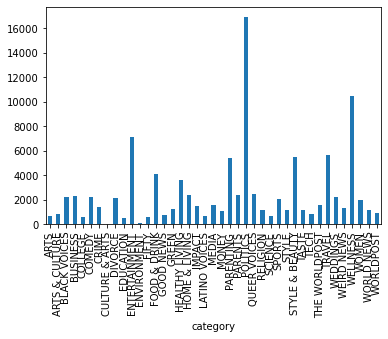

In [172]:
dfWeekDayCategory_weekday.groupby('category').size().plot.bar()

<AxesSubplot:xlabel='category'>

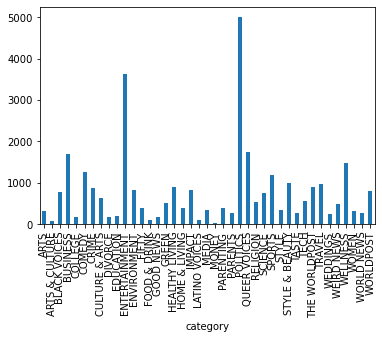

In [191]:
dfWeekDayCategory_weekend.groupby('category').size().plot.bar()

Vemos que al final la distribución es similar. Pero si podemos destacar que en weekend hay más entretainment y weekday mas wellness en comparación a las otras. 

Ahora vamos a analisar por que habia un valor muy alto de char count y word count

In [200]:
dfatr

,id,headline,authors,short_description,date,category,category_nums,authors_cat,year_num,weekday_num,char_count,word_count,punctuations_count,month,season
0,0,Does Romans 13 Give The President The Right To...,"David J. Dunn, PhD, ContributorTheological tro...",Let any who doubt the lamentable state of theo...,2017-08-12,RELIGION,26,5005,5,5,121,19,1,8,3
1,1,How To Throw A Marijuana-Friendly Wedding,NaN,Designate a pot-smoking area. While brides and...,2014-04-09,WEDDINGS,35,-1,2,2,122,20,3,4,1
2,2,The New Yorker Finally Realized Us Plebeians D...,Katla McGlynn,NaN,2014-10-23,COMEDY,5,11506,2,3,0,0,0,10,3
3,3,The 10 Best U.S. Cities For Retirement,"PureWow, ContributorWhat your girl crush reads...",Next question: When is too early to start coun...,2017-07-10,BUSINESS,3,16913,5,0,82,14,2,7,2
4,4,"Justin Bieber Punches Man In The Face, Leaves ...",Carly Ledbetter,This fan got WAY too close for comfort.,2016-11-23,ENTERTAINMENT,10,3197,4,2,39,8,1,11,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,NaN,A recent study of added sugar consumption in k...,2013-05-01,WELLNESS,37,-1,1,2,121,21,1,5,2
134567,134567,Must-Try Bohemian Trends,"W Magazine, Contributor\r\nW Magazine",Whether it was the suede dresses at Calvin Kle...,2013-11-27,STYLE & BEAUTY,30,21474,1,2,184,31,4,11,4
134568,134568,From A Dad Who Supports Breastfeeding: My Boys...,"John Willey, Contributor\r\nBlogger, DaddysInC...",What is this world coming to that people would...,2012-02-02,PARENTING,22,10345,0,3,199,36,5,2,1
134569,134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...",NaN,"The town was first established in 1913, when t...",2012-07-17,TRAVEL,34,-1,0,1,133,19,2,7,2


In [207]:
dfatr.char_count.value_counts()[:10]

0      13263
121     6031
120     5843
122     5757
123     5024
124     3979
125     3063
126     2238
127     1612
128     1084
Name: char_count, dtype: int64

In [208]:
dfatr.word_count.value_counts()[:10]

0     13263
21     7558
20     7187
22     6707
19     6196
23     5152
18     4326
11     3712
12     3701
10     3650
Name: word_count, dtype: int64

Ahi podemos ver que ademas de haber muchos 0, los caracteres suelen ser alrededor de 120 y las palabras 20. Si revisamos de nuevo el pandas profiling vemos que tambien podemos ver la información ahi. La grafica que muestra el profiling es el historgrama por eso que en ambos casos tienen un pico los valores anteriores.

En funcion de esto, capaz se podria intentar normalizar las columas.

<AxesSubplot:>

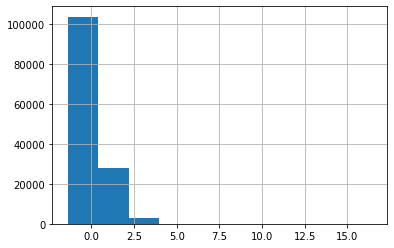

In [211]:
((dfatr.char_count-dfatr.char_count.mean())/dfatr.char_count.std()).hist()

Pero como hay muchos zeros se normalizan tomando en cuenta el 0 y no el 21 por ejemplo. 

Otra modificacion que si podes hacer es sacar la fecha. Ya vimos antes que la fecha generaba problemas a la hora de crear modelos, y ademas ahora tenemos el año, mes, día por separado, por lo tanto tener la fecha no aporta

In [226]:
dfatr = dfatr.drop('date',axis =1)

#Tambien podemos sacar la id que no aporta ya que es solo el indice de la fila 
dfatr = dfatr.drop('id',axis =1)

#Como dijimos antes, en principio el autor no lo vamos a estar usando, pero en vez de sacarlo del todo, podemos por lo menos incluir algunas metriacas del mismo, por ejemplo el largo
dfatr['author_count'] = dfatr['authors'].str.split(' ').str.len().fillna('0').astype(int)

# Como no vamos a utilizar más authors lo podemos sacar
dfatr = dfatr.drop('authors',axis =1)

In [230]:
#El dfatr final es: 
dfatr

,headline,short_description,category,category_nums,authors_cat,year_num,weekday_num,char_count,word_count,punctuations_count,month,season,author_count
0,Does Romans 13 Give The President The Right To...,Let any who doubt the lamentable state of theo...,RELIGION,26,5005,5,5,121,19,1,8,3,8
1,How To Throw A Marijuana-Friendly Wedding,Designate a pot-smoking area. While brides and...,WEDDINGS,35,-1,2,2,122,20,3,4,1,0
2,The New Yorker Finally Realized Us Plebeians D...,NaN,COMEDY,5,11506,2,3,0,0,0,10,3,2
3,The 10 Best U.S. Cities For Retirement,Next question: When is too early to start coun...,BUSINESS,3,16913,5,0,82,14,2,7,2,7
4,"Justin Bieber Punches Man In The Face, Leaves ...",This fan got WAY too close for comfort.,ENTERTAINMENT,10,3197,4,2,39,8,1,11,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,Added Sugars Make Up 13 Percent Of U.S. Adults...,A recent study of added sugar consumption in k...,WELLNESS,37,-1,1,2,121,21,1,5,2,0
134567,Must-Try Bohemian Trends,Whether it was the suede dresses at Calvin Kle...,STYLE & BEAUTY,30,21474,1,2,184,31,4,11,4,4
134568,From A Dad Who Supports Breastfeeding: My Boys...,What is this world coming to that people would...,PARENTING,22,10345,0,3,199,36,5,2,1,5
134569,"Bikinis, Texas: Businessman Buys Bankersmith, ...","The town was first established in 1913, when t...",TRAVEL,34,-1,0,1,133,19,2,7,2,0


In [18]:
# En caso que queramos aplicar todoas las transformaciones de nuevo, definimos una función
import re

def count_punctuations(text):
    cant = 0
    if(pd.isna(text)):
        return 0
    for char in text:
        if(char in string.punctuation):
            cant += 1
    return cant

def atr_transformado(init_df):
  df_with_atr = init_df.copy()
  df_with_atr['year_num'] = df_with_atr['date'].dt.year - 2012
  df_with_atr['weekday_num'] = df_with_atr['date'].dt.dayofweek
  df_with_atr['month'] = df_with_atr['date'].dt.month
  seasons = [0, 4, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4]
  df_with_atr['season'] = df_with_atr['month'].apply(lambda x : seasons[x])
  df_with_atr['char_count'] = df_with_atr['short_description'].str.len().fillna('0').astype(int)
  df_with_atr['word_count'] = df_with_atr['short_description'].str.split(' ').str.len().fillna('0').astype(int)
  df_with_atr['punctuations_count'] = df_with_atr['short_description'].apply(lambda x : count_punctuations(x))
  df_with_atr = df_with_atr.drop('date',axis =1)
  df_with_atr['author_count'] = df_with_atr['authors'].str.split(' ').str.len().fillna('0').astype(int)
  df_with_atr = df_with_atr.drop('authors',axis =1)
  return df_with_atr

### Red neuronal con los atributos

Ahora que tenemos más atributos vamos a probar el rendimiento de una red neuronal solo usando los nuevos atributos. Asi cuando despues agregemos las palabras vectorizadas, sabemos que tanto mejoran el modelo las mismas

In [19]:
df_atr2 = atr_transformado(reload_df())

# le sacamos la short description y el headings porque no los vamos a utlizar en esta parte
df_atr2 = df_atr2.drop(['headline', 'short_description'], axis = 1)
df_atr2

,category,year_num,weekday_num,month,season,char_count,word_count,punctuations_count,author_count
0,RELIGION,5,5,8,3,121,19,1,8
1,WEDDINGS,2,2,4,1,122,20,3,0
2,COMEDY,2,3,10,3,0,1,0,2
3,BUSINESS,5,0,7,2,82,14,2,7
4,ENTERTAINMENT,4,2,11,4,39,8,1,2
...,...,...,...,...,...,...,...,...,...
134566,WELLNESS,1,2,5,2,121,21,1,0
134567,STYLE & BEAUTY,1,2,11,4,184,31,4,4
134568,PARENTING,0,3,2,1,199,36,5,5
134569,TRAVEL,0,1,7,2,133,19,2,0


Ahora vamos a entrar una red neuronal con los nuevos datos

In [252]:
x = df_atr2.drop('category', axis=1)
categoriesTransform = df_atr2['category'].to_numpy()
categoriesTransform.shape
categoriesTransform = categoriesTransform.reshape(-1,1)
categoriesTransform.shape
categoryOHE = OneHotEncoder(handle_unknown='ignore')
y = categoryOHE.fit_transform(categoriesTransform)
y = y.toarray()

X_train, X_test, Y_train, Y_test = train_test_split(
    x,
    y,
    test_size=(1.0/3), random_state=42)

In [253]:
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=100)

In [254]:
model = make_NN_model(output_shapes=[20, 30, Y_train.shape[1]],
                      input_shape=len(X_train.columns),
                      use_bias=True,
                      activations=[LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                      dropouts=[Dropout(0.3), None, None],
                      opt='Adam',
                      loss='categorical_crossentropy',
                      metric=["categorical_accuracy", "Recall", "accuracy"])

training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 3s 5ms/step - loss: 6.0839 - categorical_accuracy: 0.1257 - recall: 0.0110 - accuracy: 0.1257 - val_loss: 3.1902 - val_categorical_accuracy: 0.2099 - val_recall: 5.5732e-05 - val_accuracy: 0.2099
Epoch 2/500
718/718 [==============================] - 1s 2ms/step - loss: 3.1739 - categorical_accuracy: 0.2097 - recall: 0.0073 - accuracy: 0.2097 - val_loss: 3.0033 - val_categorical_accuracy: 0.2260 - val_recall: 0.0023 - val_accuracy: 0.2260
Epoch 3/500
718/718 [==============================] - 1s 2ms/step - loss: 2.9714 - categorical_accuracy: 0.2317 - recall: 0.0138 - accuracy: 0.2317 - val_loss: 2.8499 - val_categorical_accuracy: 0.2363 - val_recall: 0.0135 - val_accuracy: 0.2363
Epoch 4/500
718/718 [==============================] - 1s 2ms/step - loss: 2.8451 - categorical_accuracy: 0.2415 - recall: 0.0150 - accuracy: 0.2415 - val_loss: 2.7618 - val_categorical_accuracy: 0.2465 - val_recall: 0.0010 - val_accuracy: 0.2465
Epoch 5/

In [255]:
print_prediction(X_test,Y_pred, Y_test)

Macro Average Recall: 26.40720913479035 %
Acurracy Socre:  30.30073344182625 %


C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


Como podemos ver, solo con las features que agregamos sin usar las palabras, las metricas no son tan buenas como antes. 
Sin embargo esto nos da una especie de baseline para ver si esto + las palabras mejora o no

### Nuevos atributos + vecotrizer

Ya hicimos el vectorizer de headlines pero vamos a hacerlo de nuevo para controlar más la cantidad de palabras, poner stops words y usar lemmer como hicimos en una prueba antes
Ademas ahora tenemos que hacer el vectorizer para short_description 

In [9]:
df = reload_df()


from nltk.stem.snowball import SnowballStemmer
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer 
import nltk
import string
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

lemmer = WordNetLemmatizer()
analyzer = CountVectorizer().build_analyzer()

def lemmed_words(doc):
    return (lemmer.lemmatize(t.lower()) for t in word_tokenize(doc) if t.lower() not in stop_words)

stops = set(stopwords.words('english'))

# Se podria agregar 's, 've, 'll etc.  a nuestra stop words, pero decidimos que no 
# porque capaz sirve para detectar el lenguaje más informal
custom_stop_word = set('q,w,e,r,t,y,u,i,o,p,a,s,d,f,g,h,j,k,l,z,x,c,v,b,n,m,and,\'\',--,``'.split(','))
combine_stop_words = stops.union(string.punctuation).union(ENGLISH_STOP_WORDS).union(custom_stop_word)
stop_words = set([lemmer.lemmatize(t) for t in combine_stop_words]).union(combine_stop_words).union(custom_stop_word)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ivanm\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ivanm\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ivanm\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


#### CountVectorizer

##### Heading

In [10]:
corpus = df['headline']

headline_count_vectorizer = CountVectorizer()
headline_count_vectorizer = CountVectorizer(max_features=250, max_df=0.9, min_df= 100, analyzer = lemmed_words)
headline_count_vectorizer.fit(corpus)

print(headline_count_vectorizer.get_feature_names()[1:100], ".....")
print(len(headline_count_vectorizer.get_feature_names()))


headlineVecTrain = headline_count_vectorizer.transform(corpus)
headlineMatrix = headlineVecTrain.toarray()
headlinesCountMatrix =  pd.DataFrame(headlineMatrix)

["'re", "'s", "'the", "'ve", '...', '1', '10', '2', '2012', '2013', '2014', '2016', '3', '4', '5', '6', '7', '8', '9', 'ad', 'america', 'american', 'art', 'attack', 'baby', 'bad', 'ban', 'beauty', 'bernie', 'best', 'better', 'big', 'black', 'body', 'book', 'boy', 'break', 'business', 'ca', 'california', 'call', 'campaign', 'cancer', 'care', 'case', 'celebrity', 'change', 'child', 'christmas', 'city', 'claim', 'climate', 'clinton', 'college', 'come', 'cop', 'country', 'couple', 'court', 'dad', 'daughter', 'day', 'dead', 'deal', 'death', 'debate', 'democrat', 'divorce', 'dog', 'donald', 'dress', 'election', 'email', 'end', 'face', 'fall', 'family', 'fan', 'fashion', 'father', 'fight', 'film', 'find', 'food', 'friend', 'future', 'game', 'gay', 'get', 'getting', 'gift', 'girl', 'going', 'good', 'gop', 'got', 'great', 'group', 'guide'] .....
250


Originalmente usamos más max_features (1000), para asi teniamos 4000 en total que era un número similar al que habiamos manejado antes. Sin embargo por problemas de RAM tuvimos que disminuirlo. Esto probablemente tenga algun efecto en el resultado. Aunque ya vimos que agregar muchas palabras más no cambia tan sustancial mente las metricas. 
Probablemente no ayude tener menos pero esperamos que no afecte tanto

##### Short_description

In [11]:
corpus = df['short_description']

description_count_vectorizer = CountVectorizer()
description_count_vectorizer = CountVectorizer(max_features=250, max_df=0.9, min_df= 100, analyzer = lemmed_words)
description_count_vectorizer.fit(corpus)

print(description_count_vectorizer.get_feature_names()[1:100], ".....")
print(len(description_count_vectorizer.get_feature_names()))


descriptionVecTrain = description_count_vectorizer.transform(corpus)
descriptionMatrix = headlineVecTrain.toarray()
descriptionCountMatrix =  pd.DataFrame(descriptionMatrix)

["'ll", "'m", "'re", "'s", "'ve", '...', '10', 'according', 'act', 'action', 'actually', 'age', 'ago', 'america', 'american', 'art', 'asked', 'away', 'baby', 'bad', 'believe', 'best', 'better', 'big', 'black', 'body', 'book', 'business', 'ca', 'called', 'came', 'campaign', 'care', 'case', 'challenge', 'change', 'check', 'child', 'choice', 'city', 'college', 'come', 'community', 'company', 'country', 'couple', 'course', 'court', 'daughter', 'day', 'deal', 'death', 'decision', 'different', 'divorce', 'donald', 'easy', 'election', 'end', 'event', 'experience', 'face', 'facebook', 'fact', 'family', 'far', 'fashion', 'favorite', 'fear', 'feel', 'feeling', 'film', 'food', 'friend', 'future', 'game', 'getting', 'girl', 'going', 'good', 'got', 'government', 'great', 'group', 'happy', 'hard', 'head', 'health', 'healthy', 'heart', 'help', 'high', 'history', 'holiday', 'home', 'hope', 'hour', 'house', 'huffpost'] .....
250


#### TfidfVectorizer

Ademas que el count vectorizer que usa la frecuencia, tambien podemos usar TfidVectorizer, que usa el numero tfidf de las palabras en vez de la frecuencia. 
Esta feature puede ser mejor ya que no solo toma en cuenta la frecuencia de la palabra, sino la frecuencia en el documento y en todos los docuementos. 
Basicamente es una manera de conseguir las palabras que tienen más probabilidad de ayudar a predecir de que dato estamos hablando 

##### Heading

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
corpus = df['headline']

headline_tfidf_vectorizer = TfidfVectorizer()
headline_tfidf_vectorizer = TfidfVectorizer(max_features=250, max_df=0.9, min_df= 100, analyzer = lemmed_words)
headline_tfidf_vectorizer.fit(corpus)

print(headline_tfidf_vectorizer.get_feature_names()[1:100], ".....")
print(len(headline_tfidf_vectorizer.get_feature_names()))


headlineVecTrain = headline_tfidf_vectorizer.transform(corpus)
headlineMatrix = headlineVecTrain.toarray()
headlinesTFIDFMatrix =  pd.DataFrame(headlineMatrix)

["'re", "'s", "'the", "'ve", '...', '1', '10', '2', '2012', '2013', '2014', '2016', '3', '4', '5', '6', '7', '8', '9', 'ad', 'america', 'american', 'art', 'attack', 'baby', 'bad', 'ban', 'beauty', 'bernie', 'best', 'better', 'big', 'black', 'body', 'book', 'boy', 'break', 'business', 'ca', 'california', 'call', 'campaign', 'cancer', 'care', 'case', 'celebrity', 'change', 'child', 'christmas', 'city', 'claim', 'climate', 'clinton', 'college', 'come', 'cop', 'country', 'couple', 'court', 'dad', 'daughter', 'day', 'dead', 'deal', 'death', 'debate', 'democrat', 'divorce', 'dog', 'donald', 'dress', 'election', 'email', 'end', 'face', 'fall', 'family', 'fan', 'fashion', 'father', 'fight', 'film', 'find', 'food', 'friend', 'future', 'game', 'gay', 'get', 'getting', 'gift', 'girl', 'going', 'good', 'gop', 'got', 'great', 'group', 'guide'] .....
250


#### Short description

In [13]:
corpus = df['short_description']

description_tfdif_vectorizer = TfidfVectorizer()
description_tfdif_vectorizer = TfidfVectorizer(max_features=250, max_df=0.9, min_df= 100, analyzer = lemmed_words)
description_tfdif_vectorizer.fit(corpus)

print(description_tfdif_vectorizer.get_feature_names()[1:100], ".....")
print(len(description_tfdif_vectorizer.get_feature_names()))


descriptionVecTrain = description_tfdif_vectorizer.transform(corpus)
descriptionMatrix = headlineVecTrain.toarray()
descriptionTfidMatrix =  pd.DataFrame(descriptionMatrix)

["'ll", "'m", "'re", "'s", "'ve", '...', '10', 'according', 'act', 'action', 'actually', 'age', 'ago', 'america', 'american', 'art', 'asked', 'away', 'baby', 'bad', 'believe', 'best', 'better', 'big', 'black', 'body', 'book', 'business', 'ca', 'called', 'came', 'campaign', 'care', 'case', 'challenge', 'change', 'check', 'child', 'choice', 'city', 'college', 'come', 'community', 'company', 'country', 'couple', 'course', 'court', 'daughter', 'day', 'deal', 'death', 'decision', 'different', 'divorce', 'donald', 'easy', 'election', 'end', 'event', 'experience', 'face', 'facebook', 'fact', 'family', 'far', 'fashion', 'favorite', 'fear', 'feel', 'feeling', 'film', 'food', 'friend', 'future', 'game', 'getting', 'girl', 'going', 'good', 'got', 'government', 'great', 'group', 'happy', 'hard', 'head', 'health', 'healthy', 'heart', 'help', 'high', 'history', 'holiday', 'home', 'hope', 'hour', 'house', 'huffpost'] .....
250


Ahora vamos a juntar agregar los datos de cada vectorizer al df que estamos trabajando ahora 

In [ ]:
del()

In [15]:
headlinesCountMatrix = headlinesCountMatrix.add_suffix("countHead")
descriptionCountMatrix = descriptionCountMatrix.add_suffix("countDesc")
headlinesTFIDFMatrix = headlinesTFIDFMatrix.add_suffix("tfidfHead")
descriptionTfidMatrix = descriptionTfidMatrix.add_suffix("tfidfDesc")

In [44]:
df_atr_vec = df_atr2
df_atr_vec = df_atr_vec.join(headlinesCountMatrix)
df_atr_vec = df_atr_vec.join(descriptionCountMatrix)
df_atr_vec = df_atr_vec.join(headlinesTFIDFMatrix)
df_atr_vec = df_atr_vec.join(descriptionTfidMatrix)

In [45]:
df_atr_vec

,category,year_num,weekday_num,month,season,char_count,word_count,punctuations_count,author_count,0countHead,...,240tfidfDesc,241tfidfDesc,242tfidfDesc,243tfidfDesc,244tfidfDesc,245tfidfDesc,246tfidfDesc,247tfidfDesc,248tfidfDesc,249tfidfDesc
0,RELIGION,5,5,8,3,121,19,1,8,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,WEDDINGS,2,2,4,1,122,20,3,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,COMEDY,2,3,10,3,0,1,0,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,BUSINESS,5,0,7,2,82,14,2,7,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ENTERTAINMENT,4,2,11,4,39,8,1,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134566,WELLNESS,1,2,5,2,121,21,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
134567,STYLE & BEAUTY,1,2,11,4,184,31,4,4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
134568,PARENTING,0,3,2,1,199,36,5,5,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
134569,TRAVEL,0,1,7,2,133,19,2,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Ya tenemos todos los datos y features que queremo, ahra a hacer la red neuronal 

In [46]:
x = df_atr_vec.drop('category', axis=1)
categoriesTransform = df_atr_vec['category'].to_numpy()
categoriesTransform.shape
categoriesTransform = categoriesTransform.reshape(-1,1)
categoriesTransform.shape
categoryOHE = OneHotEncoder(handle_unknown='ignore')
y = categoryOHE.fit_transform(categoriesTransform)
y = y.toarray()

X_train, X_test, Y_train, Y_test = train_test_split(
    x,
    y,
    test_size=(1.0/3), random_state=42)

In [47]:
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=100)
model = make_NN_model(output_shapes=[20, 30, Y_train.shape[1]],
                      input_shape=len(X_train.columns),
                      use_bias=True,
                      activations=[LeakyReLU(alpha=0.3), LeakyReLU(alpha=0.3), 'softmax'],
                      dropouts=[Dropout(0.3), None, None],
                      opt='Adam',
                      loss='categorical_crossentropy',
                      metric=["categorical_accuracy", "Recall", "accuracy"])

training = model.fit(X_train, Y_train, epochs=500, batch_size=100, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/500
718/718 [==============================] - 2s 3ms/step - loss: 3.0229 - categorical_accuracy: 0.2555 - recall: 0.0532 - accuracy: 0.2555 - val_loss: 2.5879 - val_categorical_accuracy: 0.3406 - val_recall: 0.1028 - val_accuracy: 0.3406
Epoch 2/500
718/718 [==============================] - 1s 2ms/step - loss: 2.4853 - categorical_accuracy: 0.3560 - recall: 0.1423 - accuracy: 0.3560 - val_loss: 2.3526 - val_categorical_accuracy: 0.3839 - val_recall: 0.1688 - val_accuracy: 0.3839
Epoch 3/500
718/718 [==============================] - 1s 2ms/step - loss: 2.3562 - categorical_accuracy: 0.3803 - recall: 0.1747 - accuracy: 0.3803 - val_loss: 2.2781 - val_categorical_accuracy: 0.3939 - val_recall: 0.1919 - val_accuracy: 0.3939
Epoch 4/500
718/718 [==============================] - 1s 2ms/step - loss: 2.3038 - categorical_accuracy: 0.3901 - recall: 0.1858 - accuracy: 0.3901 - val_loss: 2.2536 - val_categorical_accuracy: 0.3985 - val_recall: 0.1903 - val_accuracy: 0.3985
Epoch 5/500


In [49]:
Y_pred = model.predict(X_test)

In [50]:
print_prediction(X_test,Y_pred, Y_test)

Macro Average Recall: 46.121889412706366 %
Acurracy Socre:  45.36415721069175 %


C:\Users\ivanm\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1850: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


El ultimo resulado nos siguio dando en el mismo entrono. 
Esta vez agregando mas features. 
Puede ser por que ademas de agregar más features tuvimos que hacer menos cantidad de palabras (250 cada uno, 1000 en total)

### Ultima subida a Kaggle

Para terminar el obligatorio queremos hacer una ultima subida a kaggle con nuestro ultimo modelo. Aunque no parece haber mejorado sustancialmente queremos que quede registro 

In [63]:
dftest=pd.read_csv("new_classification_test.csv", sep = ",")
dftest['date'] = (dftest['date']).astype(str)
dftest['date'] = pd.to_numeric(dftest['date'].str.replace('-',''))
dftest['date'] = pd.to_datetime(dftest['date'], format='%Y%m%d')
dftest['authors'] = (dftest['authors']).astype('category')
dftest = dftest.drop(columns=['id'])
dftest['headline'] = dftest['headline'].fillna('')
dftest['short_description'] = dftest['short_description'].fillna('')

dftest = atr_transformado(dftest)



In [64]:
corpus = dftest['headline']
headlineVecTest= headline_count_vectorizer.transform(corpus)
headlineMatrix = headlineVecTest.toarray()
dftest = dftest.join(pd.DataFrame(headlineMatrix).add_suffix("countHead"))


corpus = dftest['short_description']
shortVecTest= description_count_vectorizer.transform(corpus)
headlineMatrix = shortVecTest.toarray()
dftest =  dftest.join(pd.DataFrame(headlineMatrix).add_suffix("countShort"))

corpus = dftest['headline']
headlineVecTest= headline_tfidf_vectorizer.transform(corpus)
headlineMatrix = headlineVecTest.toarray()
dftest =  dftest.join(pd.DataFrame(headlineMatrix).add_suffix("tfidfHead"))

corpus = dftest['short_description']
headlineVecTest= description_tfdif_vectorizer.transform(corpus)
headlineMatrix = headlineVecTest.toarray()
dftest =  dftest.join(pd.DataFrame(headlineMatrix).add_suffix("tfidfShort"))

In [65]:
dftest = dftest.drop(columns=['short_description', 'headline'])

In [66]:
dftest

,year_num,weekday_num,month,season,char_count,word_count,punctuations_count,author_count,0countHead,1countHead,...,240tfidfShort,241tfidfShort,242tfidfShort,243tfidfShort,244tfidfShort,245tfidfShort,246tfidfShort,247tfidfShort,248tfidfShort,249tfidfShort
0,3,1,6,2,120,22,6,2,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,1,12,4,74,13,4,2,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,1,4,1,124,26,0,9,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,4,3,1,204,35,4,10,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,6,2,1,104,17,3,2,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66277,2,6,8,3,0,1,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
66278,1,2,6,2,121,20,1,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
66279,1,1,7,2,126,21,7,7,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
66280,4,6,4,1,98,18,3,2,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
Y_pred = model.predict(dftest)

In [69]:
Y_pred

array([[5.8868886e-03, 3.4595912e-03, 3.1198667e-02, ..., 2.8571432e-02,
        3.9994129e-04, 3.4365992e-03],
       [7.4260985e-04, 1.3194140e-02, 4.6487927e-02, ..., 8.8973176e-03,
        2.2419004e-03, 3.5728619e-04],
       [5.2219722e-02, 5.2254139e-03, 1.4119998e-02, ..., 1.9734137e-01,
        9.2867231e-05, 3.4017139e-03],
       ...,
       [1.0703791e-11, 9.3931956e-14, 3.4905688e-03, ..., 3.2003469e-09,
        3.8399950e-11, 4.7426276e-08],
       [4.3965010e-03, 2.9541140e-02, 2.5153650e-02, ..., 2.8305616e-02,
        1.8439101e-02, 6.3630692e-03],
       [2.7840182e-03, 3.5865563e-05, 3.7606619e-03, ..., 4.4453773e-03,
        4.0072350e-06, 2.5471139e-03]], dtype=float32)

In [74]:
Y_pred_cat_kaggle = pd.DataFrame(Y_pred)
Y_pred_cat_kaggle["category"] = categoryOHE.inverse_transform(Y_pred)
Y_pred_cat_kaggle = Y_pred_cat_kaggle["category"] 

pd.DataFrame(data=Y_pred_cat_kaggle).to_csv("final.csv")

# Conslusión 

Con esta última subida a kaggle consluimos el obligatorio, pero queremos reflexionar un poco de lo que hicimos y por donde creamos que podriamos seguir con lo que aprendimos


Resumen: 

 - Hicimos un baseline con un modelo tradicional para tener una idea de que tan bueno por lo menos tendrian que ser los siguientes modelos
 - Usamos vectorize tanto para count words como para tfidf
 - Agregamos nuestras propias features
 - Hicimos una red neuronal con una performance decente
 - Probamos distintanas redes neuronales, cambiando sus weight y funciones de activación
 - Probamos cambiar la bag of words, por ejemplo agarrando de cada categoria y no de todas a la vez
 - Hicimos un analisis que despues nos ayudo bastante en elegir que ingenieria de atributos hacer, y para ver cuando alguna atributo capaz no valia tanto la pena. Graficas como la cantidad de categorias a lo largo de los años sirvieron para tener un contexto de como cambiaba el target. 

Cosas que se podriamos mejorar
- Buscar alguna feature o combinacion de features nuevas ademas de las que ya probamos
- Hacer un modelo tracional más complejo (En verdad hicimos un baggin de arboles pero no nos dio el tiempo para probarlo con todas las nuevas columnas)
- Probar con más palabras en la ultima red neuronal (no nos dio la RAM)
- Usar todos los datos que nos dieron para entrenar el modelo. El resultado que nos importaba era el de kaggle (el de la "realidad") por lo tanto era valido e incluso mejor usar todos los datos a nuestra disponicion para probar el ultimo modelo. Tener más datos casi siempre es mejor. 
 - Revisar e intentar elegir mejor las palbras. Intentamos distintas formas pero ninguna dio muchos fruto
 - Hacer un analisis más individual de cada mejora que hacemos. A veces mejorabamos dos o tres cosas de un modelo al mismo tiempo, por lo tanto es dificil darse cuenta que fue que mejoro el modelo y si hubo algo que lo empeoro. En general siempre intentamos hacer las mejorar más chicas posibles. 
 - El ultimo modelo no termino siendo una mejora, tendiramos que revisar más profundamente. De todos modos, no tenia por que serlo ya que localmente (con nuestro datos) tampoco fue una mejora sustancial. 
 - Hacer más "cross validation" para elegir metaparametros. Por ejemplo el stemmer y el lemmer. Aunque justo en ese caso elegimos quedarnos con el lemmer por que vimos que podia tener un poco mas de sentido. No teniamos el problema de palabras mal escritas, ya que eran textos de noticias. 

Nota: En muchos lados hicimos la separación de train y test y queriamos aclarar una cosa. Si bien no usamos test para entrenar el modelo, si usamos test para ir elegiendo el modelo en función de que daba buenos resultados. Por lo tanto nuestro test no es tan imparcial como deberia serlo. 
El test de kaggle si fue solo usado para testera si teniamos un modelo bueno o no. Generalmente nos daban similares entonces, con el test nuestro ya podiamos elegir nuevos modelos. 

En resumen: Creamos que llegamos a un buen modelo aunque tenga varios puntos de mejorar que detectamos. Probamos distintos modelos y distintas opciones dentro de los mismos modelos que nos ayudo a guiarnos a uno mejor. 
El analisis inicial fue crucial para saber donde estabamos parados y por donde seguir. 